# Loan Default Prediction Project

## Introduction

In this project, we are analyzing a dataset related to bank loans to predict loan defaults. Our goal is to utilize machine learning models to understand the factors influencing loan defaults and to accurately predict them. This analysis could be instrumental for financial institutions in making informed decisions about loan approvals and risk management.

## Initial Data Exploration

### Dataset Overview
The dataset comprises various features related to borrowers, including age, education level, employment history, address, income, and debt-related metrics. We begin by loading the dataset and examining the first and last few rows to understand the data structure and contents.

### Data Cleaning and Preprocessing
- **Summary Statistics**: We generate descriptive statistics to get an overview of the data distribution and identify any immediate anomalies or patterns.
- **Event Rate Calculation**: The event rate for loan defaults is calculated, providing us with a baseline understanding of how many loans in the dataset have defaulted.
- **Missing Values Check**: We inspect the dataset for any missing values, which are crucial for data quality and model accuracy.
- **Correlation Analysis**: A heatmap of the correlation matrix is created to visualize the relationships between different features.

### Visual Exploratory Data Analysis (EDA)
- **Box Plots**: We use box plots for each numeric column to visualize the distribution and identify potential outliers.
- **Distribution Plots**: Histograms are generated for each numeric variable to understand their distribution and identify any skewness.
- **Pair Plot**: A pair plot is created for selected variables, including the target variable 'default', to visualize pairwise relationships and how they differ for default and non-default loans.
- **Target Variable Analysis**: The distribution of the target variable 'default' is visualized using both a countplot and a pie chart, offering insights into the balance of classes.

### Data Splitting
Finally, we split the dataset into training and testing sets, which will be used to build and evaluate various machine learning models, including Logistic Regression, Decision Trees, SVM, Random Forest, XGBoost, and Neural Networks.

This preliminary data exploration sets the foundation for further analysis and model building, enabling us to approach the problem of predicting loan defaults with a data-driven mindset.



--- First Few Rows of the Dataset ---
   age  ed  employ  address  income  debtinc   creddebt   othdebt  default
0   41   3      17       12     176      9.3  11.359392  5.008608        1
1   27   1      10        6      31     17.3   1.362202  4.000798        0
2   40   1      15       14      55      5.5   0.856075  2.168925        0
3   41   1      15       14     120      2.9   2.658720  0.821280        0
4   24   2       2        0      28     17.3   1.787436  3.056564        1

--- Last Few Rows of the Dataset ---
     age  ed  employ  address  income  debtinc  creddebt   othdebt  default
695   36   2       6       15      27      4.6  0.262062  0.979938        1
696   29   2       6        4      21     11.5  0.369495  2.045505        0
697   33   1      15        3      32      7.6  0.491264  1.940736        0
698   45   1      19       22      77      8.4  2.302608  4.165392        0
699   37   1      12       14      44     14.7  2.994684  3.473316        0

--- Summary Stat

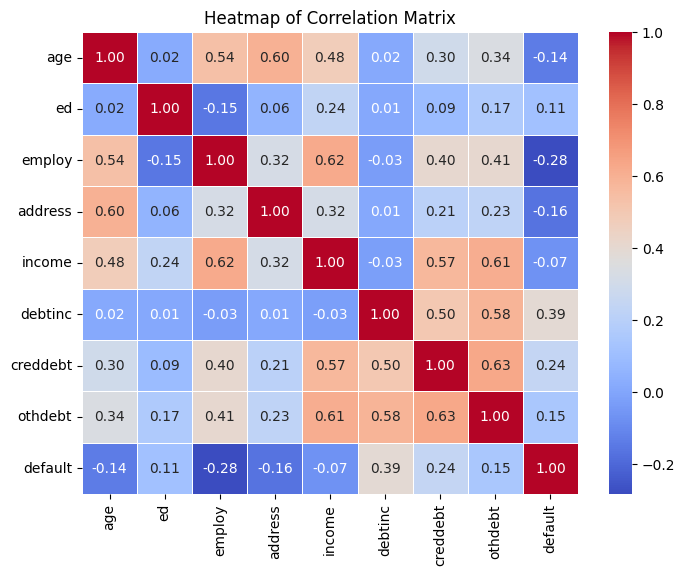


--- Box Plots for Each Numeric Column ---


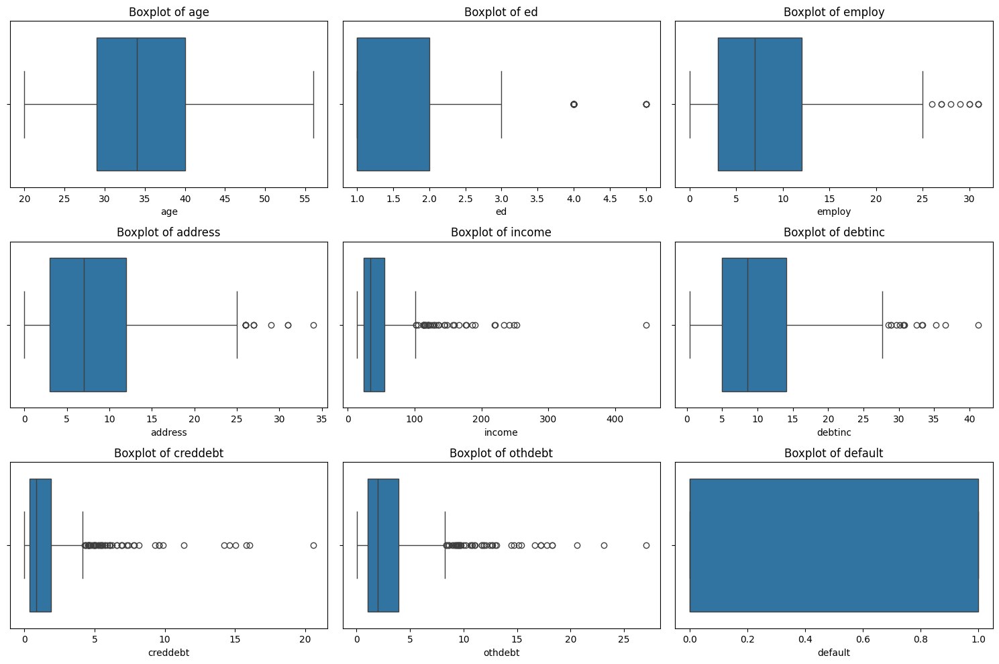


--- Distribution Plots for Numeric Variables ---


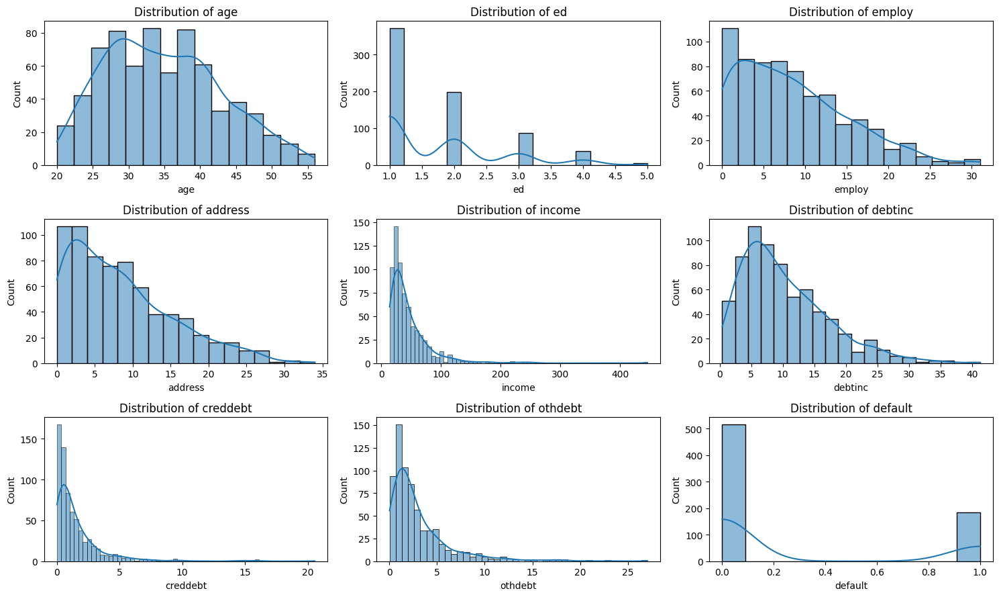


--- Pair Plot for Numeric Variables ---

--- Target Variable Analysis ---


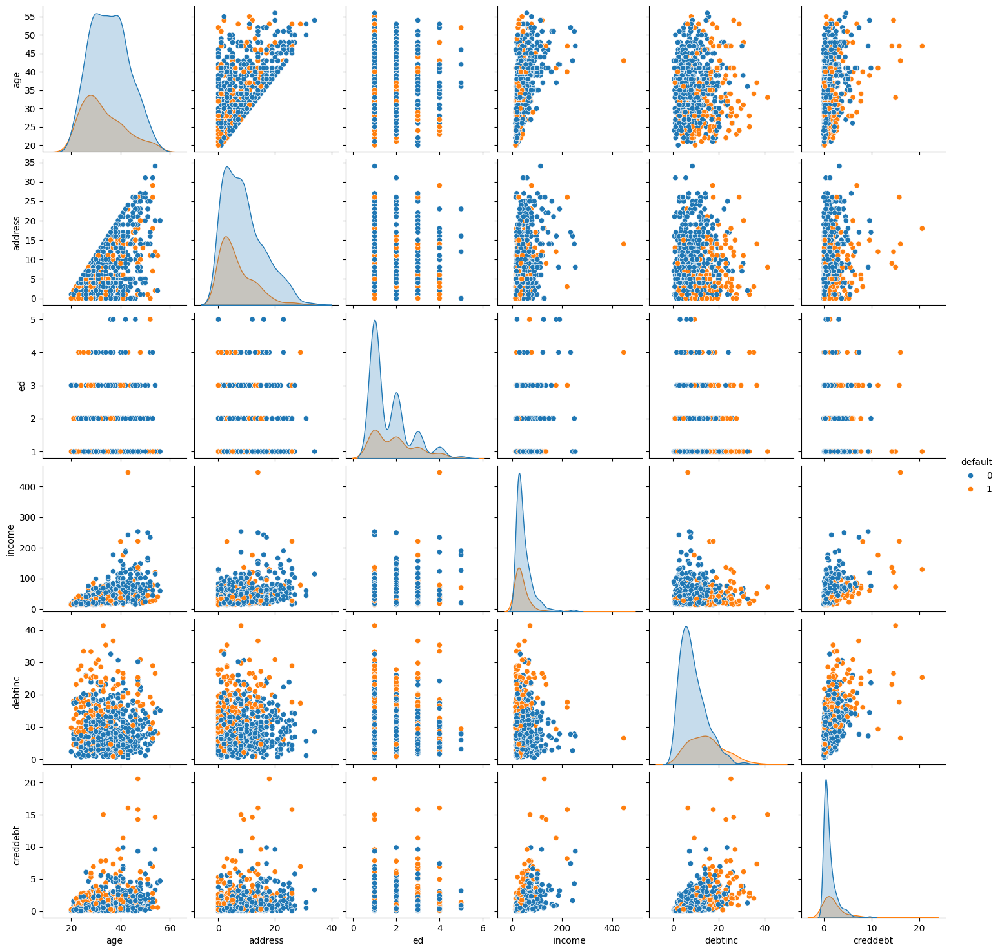

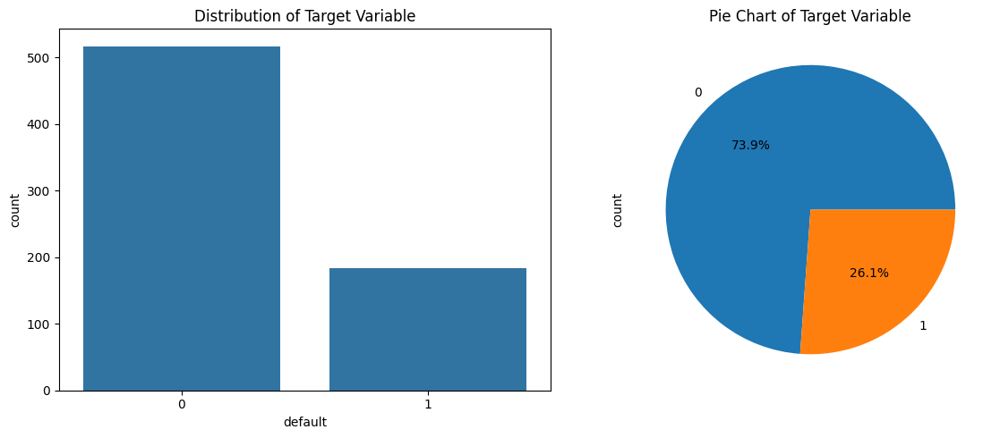


--- Splitting Data into Train and Test Sets ---


In [ ]:
########################################
#DATA IMPORT AND EXPLORATION           #
########################################

import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score, recall_score, precision_score, roc_curve, auc
import matplotlib.pyplot as plt
import seaborn as sns
import requests
import certifi
import warnings
warnings.filterwarnings('ignore')

# Load the dataset
url = 'https://github.com/Safa1615/Dataset--loan/blob/main/bank-loan.csv?raw=true'
# data = pd.read_csv(url, nrows=700)

# Getting a SSL error while loading the data from the URL
response = requests.get(url, verify=certifi.where())

# Save the content to a local file
with open('bank-loan.csv', 'wb') as file:
    file.write(response.content)

data = pd.read_csv('bank-loan.csv', nrows=700)

# Displaying the first few rows of the dataset
print("\n--- First Few Rows of the Dataset ---")
print(data.head())

# Displaying the first few rows of the dataset
print("\n--- Last Few Rows of the Dataset ---")
print(data.tail())

# Section 2: Data Exploration
print("\n--- Summary Statistics ---")
print(data.describe())

# Calculating and displaying the event rate
event_rate = data['default'].mean() * 100
print(f'\nEvent Rate: {event_rate:.2f}%')

# Checking and displaying missing values
missing_values = data.isnull().sum()
missing_values_df = pd.DataFrame({'Column': missing_values.index, 'Missing Values': missing_values.values})
print("\n--- Missing Values in Each Column ---")
print(missing_values_df)

# Heatmap visualization
print("\n--- Heatmap of Correlation Matrix ---")
plt.figure(figsize=(8, 6))
sns.heatmap(data.corr(), annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Heatmap of Correlation Matrix')
plt.show()

# Box plot visualization
print("\n--- Box Plots for Each Numeric Column ---")
numeric_cols = data.select_dtypes(include=['float64', 'int64']).columns
n_rows, n_cols = 3, 3
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 10))
axes = axes.flatten()
for i, col in enumerate(numeric_cols):
    sns.boxplot(x=data[col], ax=axes[i])
    axes[i].set_title(f'Boxplot of {col}')
for i in range(len(numeric_cols), len(axes)):
    fig.delaxes(axes[i])
plt.tight_layout()
plt.show()

# Distribution Plots for Each Numeric Variable
print("\n--- Distribution Plots for Numeric Variables ---")
import math  # Import the math module

# Numeric columns for distribution plots
numeric_cols = data.select_dtypes(include=['float64', 'int64']).columns

# Calculate the number of rows and columns for the grid
n_cols = 3  # You can adjust this number as needed
n_rows = math.ceil(len(numeric_cols) / n_cols)

# Create a figure and a grid of subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, n_rows * 3))

# Flatten the array of axes for easy iteration
axes = axes.flatten()

# Create distribution plots
for i, col in enumerate(numeric_cols):
    sns.histplot(data[col], kde=True, ax=axes[i])
    axes[i].set_title(f'Distribution of {col}')

# Remove empty subplots
for i in range(len(numeric_cols), len(axes)):
    fig.delaxes(axes[i])

plt.tight_layout()
plt.show()

# 2. Categorical Variable Analysis (If applicable)
# Replace 'categorical_col' with your actual categorical columns
# categorical_cols = ['categorical_col1', 'categorical_col2']
# print("\n--- Categorical Variable Analysis ---")
# for col in categorical_cols:
#     plt.figure()
#     sns.countplot(x=col, data=data)
#     plt.title(f'Distribution of {col}')
#     plt.show()

# 3. Pair Plot
print("\n--- Pair Plot for Numeric Variables ---")
sns.pairplot(data[['age','address','ed','income','debtinc','creddebt','default']], hue='default')

# 5. Target Variable Analysis (Countplot and Pie Chart side by side)
print("\n--- Target Variable Analysis ---")
fig, ax = plt.subplots(1, 2, figsize=(12, 5))

# Countplot
sns.countplot(x='default', data=data, ax=ax[0])
ax[0].set_title('Distribution of Target Variable')

# Pie chart
data['default'].value_counts().plot.pie(autopct='%1.1f%%', ax=ax[1])
ax[1].set_title('Pie Chart of Target Variable')

plt.tight_layout()
plt.show()

# Section 3: Define Features and Split into Train and Test
print("\n--- Splitting Data into Train and Test Sets ---")
X = data.drop('default', axis=1)
y = data['default']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

## Interquartile Range (IQR) Method for Outlier Adjustment

The Interquartile Range (IQR) method is a widely used technique for identifying and handling outliers in data. It focuses on the statistical dispersion of the data points and is particularly effective in robustly estimating the variability of a dataset.

#### Understanding IQR
- **IQR Definition**: The IQR is the range between the first quartile (25th percentile) and the third quartile (75th percentile) of a dataset. It represents the middle 50% of the data.
- **Calculating IQR**: 
  - First, the dataset is sorted.
  - The first quartile (Q1) is the median of the first half of the data.
  - The third quartile (Q3) is the median of the second half of the data.
  - IQR = Q3 - Q1.

#### Identifying Outliers Using IQR
- Outliers are typically defined as observations that fall below Q1 - 1.5 * IQR or above Q3 + 1.5 * IQR.
- This rule is based on the assumption that data is normally distributed, and it covers approximately 99.3% of data points in such a distribution.

#### Benefits of Using IQR Method
1. **Robustness**: Unlike mean and standard deviation, IQR is not influenced by extreme values. This makes it more robust in the presence of outliers.
2. **Applicability**: It can be used with any distribution, whether normal or skewed.
3. **Simplicity**: The method is straightforward to understand and implement.
4. **Flexibility**: The 1.5 * IQR rule can be adjusted (e.g., to 3 * IQR) for different applications or data distributions.

#### Limitations
- While effective, the IQR method may not be suitable for datasets with a very skewed distribution or when the definition of an 'outlier' is different from the standard statistical definition.
- It may also remove legitimate values that are naturally extreme, especially in datasets with high variability.

In summary, the IQR method offers a practical and robust approach for identifying outliers, making it a valuable tool in preliminary data cleaning and analysis.


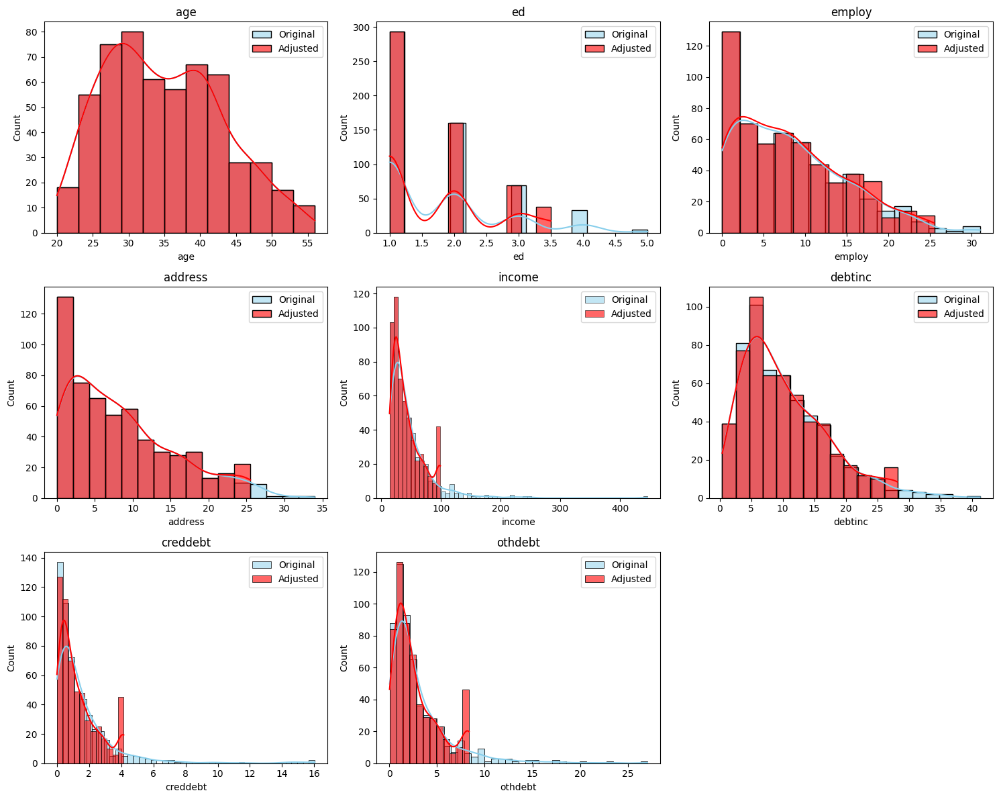

In [2]:
########################################
# ADJUST OUTLIERS USING 1.5 IQR        #
########################################

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Make copies of the original training and testing data for comparison
original_train = X_train.copy()
original_test = X_test.copy()

# Adjust for outliers and create binary indicators for both train and test sets
for feature in X_train.columns:
    Q1 = X_train[feature].quantile(0.25)
    Q3 = X_train[feature].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    # Create a new binary column indicating if the value was adjusted
    outlier_col_name = f'{feature}_outlier'
    X_train[outlier_col_name] = ((X_train[feature] < lower_bound) | (X_train[feature] > upper_bound)).astype(int)
    X_test[outlier_col_name] = ((X_test[feature] < lower_bound) | (X_test[feature] > upper_bound)).astype(int)
    
    # Adjust the feature values for outliers
    X_train[feature] = np.clip(X_train[feature], lower_bound, upper_bound)
    X_test[feature] = np.clip(X_test[feature], lower_bound, upper_bound)

# Visualization of original vs adjusted distributions
numeric_features = original_train.select_dtypes(include=['float64', 'int64']).columns
n_cols = 3
n_rows = (len(numeric_features) + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, n_rows * 4))
axes = axes.flatten()

for i, feature in enumerate(numeric_features):
    sns.histplot(original_train[feature], color="skyblue", kde=True, ax=axes[i], label='Original')
    sns.histplot(X_train[feature], color="red", kde=True, ax=axes[i], label='Adjusted', alpha=0.6)
    axes[i].set_title(feature)
    axes[i].legend()

# Remove unused subplots
for i in range(len(numeric_features), len(axes)):
    fig.delaxes(axes[i])

plt.tight_layout()
plt.show()

# Feature Engineering and Scaling in Machine Learning

## Overview

Feature engineering, including the creation of polynomial and interaction terms, followed by feature scaling, is a fundamental aspect of preparing data for machine learning models. This approach extends the feature space to capture more complex relationships and then scales these features for consistent model performance.

## Feature Engineering: Polynomial and Interaction Terms
- **Expanding Feature Space**: Polynomial and interaction terms help in capturing non-linear relationships and complex dependencies between features.
- **Use in Linear Models**: Especially beneficial for linear models, as they can now model non-linear relationships.
- **Enhanced Model Performance**: Can lead to better model accuracy by providing more informative features.

### Pros
- **Captures Complex Relationships**: Unveils hidden patterns in the data that simple linear features might miss.
- **Improves Model Accuracy**: Can lead to better predictions by providing more relevant features.

### Cons
- **Increased Model Complexity**: More features can lead to increased computational cost and complexity.
- **Risk of Overfitting**: With an increased number of features, models might overfit the training data.

## Feature Scaling: Standardization
- **Uniform Feature Scale**: `StandardScaler` standardizes features by removing the mean and scaling to unit variance, ensuring that all features contribute equally to model training.
- **Essential for Distance-Based and Gradient Descent Algorithms**: Ensures consistent performance across all features.

### Pros
- **Faster Convergence in Optimization Algorithms**: Helps in faster convergence of gradient descent in algorithms like Linear Regression and Neural Networks.
- **Balanced Feature Contribution**: Prevents features with larger scales from dominating the model's decisions.

### Cons
- **Potential Loss of Interpretability**: Original units and scales of features are lost, which might affect the interpretability.
- **Additional Preprocessing Step**: Adds to the complexity of data preprocessing pipeline.

### Polynomial Feature Expansion
- **Code Implementation**: `PolynomialFeatures` with `interaction_only=False` generates both interaction and squared terms. This increases the feature space, capturing more complex relationships in the data.
- **Application**: Suitable for datasets where modeling the interaction and non-linear relationships between features can provide deeper insights.

### Standard Scaling of Expanded Features
- **Code Implementation**: `StandardScaler` normalizes the expanded feature set. This is critical as the polynomial transformation can introduce a wide range of values.
- **Visualization**: The comparison between original and scaled distributions of features is visualized using histograms, providing insights into the effects of these transformations.

### Visualization
- **Purpose**: Helps in visualizing the impact of both polynomial feature expansion and scaling on the data distribution.
- **Insight**: Ensures that the transformations are appropriate and do not distort the data in a way that could be detrimental to model training.

The combination of polynomial feature expansion and standard scaling prepares the dataset for more complex modeling, ensuring that both linear and non-linear relationships are captured and that all features contribute equally to the model training process.


Filtered Polynomial and Interaction Features: ['age' 'ed' 'employ' 'address' 'income' 'debtinc' 'creddebt' 'othdebt'
 'age^2' 'age ed' 'age employ' 'age address' 'age income' 'age debtinc'
 'age creddebt' 'age othdebt' 'ed^2' 'ed employ' 'ed address' 'ed income'
 'ed debtinc' 'ed creddebt' 'ed othdebt' 'employ^2' 'employ address'
 'employ income' 'employ debtinc' 'employ creddebt' 'employ othdebt'
 'address^2' 'address income' 'address debtinc' 'address creddebt'
 'address othdebt' 'income^2' 'income debtinc' 'income creddebt'
 'income othdebt' 'debtinc^2' 'debtinc creddebt' 'debtinc othdebt'
 'creddebt^2' 'creddebt othdebt' 'othdebt^2']


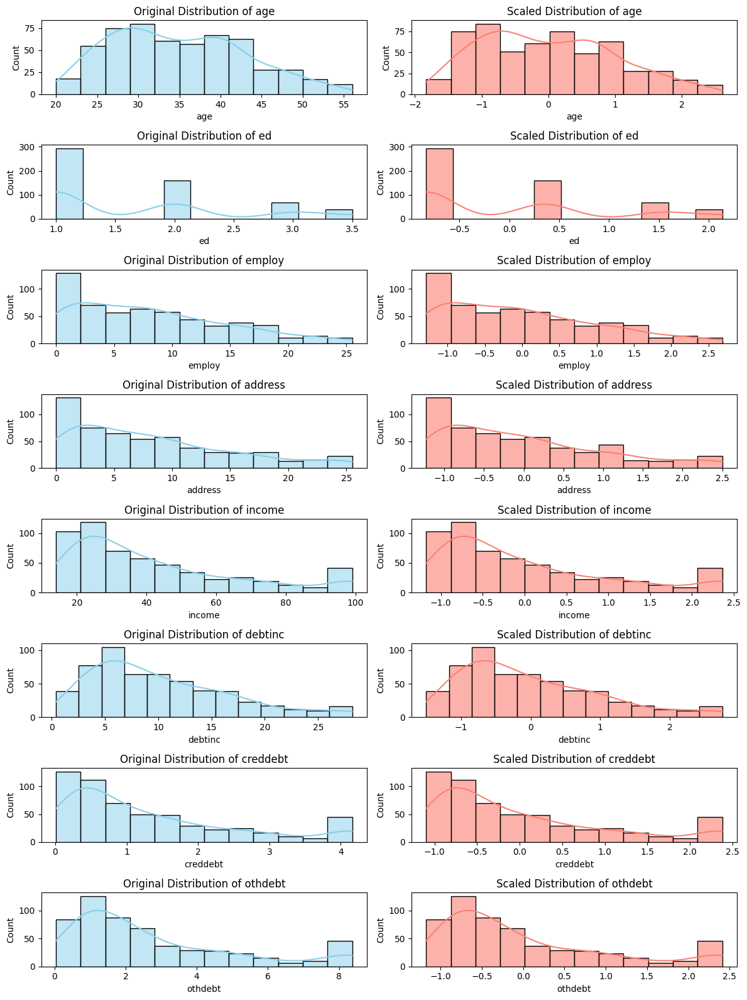

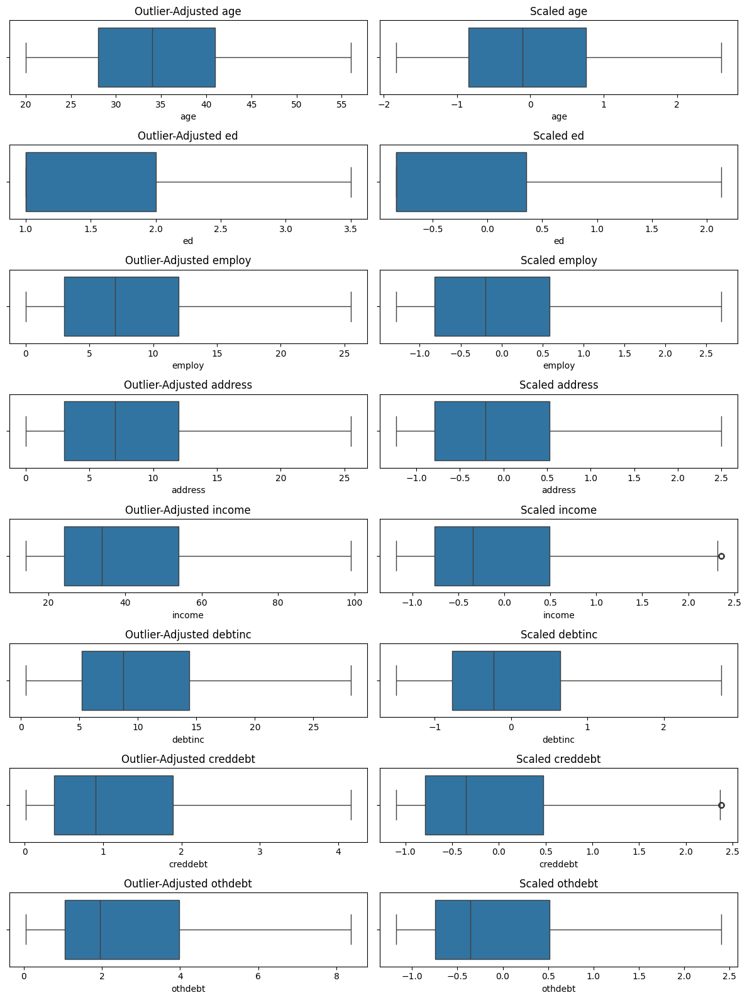

In [3]:
########################################
#FEATURE ENGINEERING SECTION           #
########################################

import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
import matplotlib.pyplot as plt
import seaborn as sns

# Original feature names without binary indicators
original_features = ['age', 'ed', 'employ', 'address', 'income', 'debtinc', 'creddebt', 'othdebt']

# Create PolynomialFeatures instance with interaction_only=False to include squared terms
poly = PolynomialFeatures(degree=2, interaction_only=False, include_bias=False)

# Fit and transform the training data with original features, interaction terms, and squared terms
X_train_poly = poly.fit_transform(X_train[original_features])
X_test_poly = poly.transform(X_test[original_features])

# Get the feature names after polynomial transformation
poly_feature_names = poly.get_feature_names_out(original_features)

print("Filtered Polynomial and Interaction Features:", poly_feature_names)

# Scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_poly)
X_test_scaled = scaler.transform(X_test_poly)

# Create DataFrames for the scaled data
X_train_scaled_df = pd.DataFrame(X_train_scaled, columns=poly_feature_names)
X_test_scaled_df = pd.DataFrame(X_test_scaled, columns=poly_feature_names)

# Visualization for Comparison
n_cols = 2  # Columns for original and scaled data
n_rows = len(original_features)  # Number of rows is based on the number of original features

fig, axes = plt.subplots(n_rows, n_cols, figsize=(12, n_rows * 2))
axes = axes.flatten()

for i, feature in enumerate(original_features):
    # Original feature distribution
    sns.histplot(X_train[feature], kde=True, ax=axes[2*i], color="skyblue", label='Original')
    axes[2*i].set_title(f'Original Distribution of {feature}')

    # Scaled feature distribution
    sns.histplot(X_train_scaled_df[feature], kde=True, ax=axes[2*i + 1], color="salmon", label='Scaled', alpha=0.6)
    axes[2*i + 1].set_title(f'Scaled Distribution of {feature}')

plt.tight_layout()
plt.show()


# Visualization of box plots for outlier-adjusted and scaled features
original_features = ['age', 'ed', 'employ', 'address', 'income', 'debtinc', 'creddebt', 'othdebt']
n_cols = 2  # Two columns for each feature: outlier-adjusted and scaled
n_rows = len(original_features)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(12, n_rows * 2))
axes = axes.flatten()

for i, feature in enumerate(original_features):
    # Outlier-adjusted feature boxplot
    sns.boxplot(x=X_train[feature], ax=axes[2*i])
    axes[2*i].set_title(f'Outlier-Adjusted {feature}')

    # Scaled feature boxplot
    scaled_feature_name = feature  # Update if the scaled feature name is different
    sns.boxplot(x=X_train_scaled_df[scaled_feature_name], ax=axes[2*i + 1])
    axes[2*i + 1].set_title(f'Scaled {scaled_feature_name}')

plt.tight_layout()
plt.show()

### Logistic Regression in Machine Learning

Logistic Regression is a widely used algorithm in supervised learning, especially for binary classification problems. It is simple, interpretable, and often serves as a good starting point for binary classification tasks.

### Overview of the Code

In this code, Logistic Regression is used in conjunction with GridSearchCV for hyperparameter tuning. This combination enhances the model's performance by finding the most optimal parameters.

### GridSearchCV
- **Purpose**: Automates the process of finding the best parameters (like `C`, `solver`, `max_iter`, `penalty`) for Logistic Regression.
- **Process**: It trains the model multiple times on a range of values for each hyperparameter and evaluates using cross-validation.
- **Advantages**: Increases the likelihood of finding the most effective combination of parameters.
- **Drawbacks**: Computationally intensive, especially with large datasets and a wide range of hyperparameters.

### Hyperparameters in Logistic Regression
- **`C`**: Inverse of regularization strength. Smaller values indicate stronger regularization, which helps to avoid overfitting but can cause underfitting if too strong.
- **`solver`**: Algorithm to use for optimization (e.g., `liblinear`, `lbfgs`). Choice of solver can affect the performance and convergence of the model.
- **`max_iter`**: Maximum number of iterations taken for the solvers to converge. Increasing this value can help with convergence but increases computational time.
- **`penalty`**: Used to specify the norm used in the penalization (regularization). Regularization can prevent overfitting by penalizing large coefficients.

### Pros and Cons of Logistic Regression
#### Pros
- **Simplicity and Interpretability**: Easy to implement and interpret. The effect of each feature is directly expressed in terms of odds ratios.
- **Efficiency**: Fast to train, making it suitable for situations where interpretability is crucial and the dataset is not overly complex.
- **Probabilistic Approach**: Provides probabilities for outcomes, which can be a critical advantage in certain applications like risk modeling.

#### Cons
- **Limited to Linear Relationships**: Assumes a linear relationship between the independent variables and the log odds of the dependent variable.
- **Performance Issues**: May not perform well with non-linear data unless transformed correctly. It's also not suitable for complex relationships in data.
- **Sensitive to Imbalanced Data**: The performance can be significantly affected by unbalanced datasets.

### Conclusion

In summary, while Logistic Regression is a powerful and straightforward tool for binary classification problems, its effectiveness depends on the nature of the data and the proper tuning of hyperparameters. It works best when the decision boundary is linear and the features are roughly linearly related to the log odds of the dependent variable. Complex, non-linear relationships may require more sophisticated methods or feature engineering strategies.


In [4]:
########################################
#LOGISTIC REGRESSION MODEL             #
########################################

from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, recall_score, precision_score

# Define the hyperparameters for logistic regression
log_reg_params = {
    'C': [0.01, 0.1, 1],  # Regularization strength
    'solver': ['lbfgs', 'liblinear', 'saga'],  # Algorithms to use in the optimization
    'max_iter': [200, 500, 1000],  # Increased maximum number of iterations
    'penalty': ['l2'],  # Use 'l2' as 'none' is deprecated
}

# Create GridSearchCV object with LogisticRegression
log_reg = GridSearchCV(LogisticRegression(), log_reg_params, cv=5, scoring='accuracy')

# Fit the model on the training set using the scaled features
log_reg.fit(X_train_scaled, y_train)

# Predict on the test set
log_reg_pred = log_reg.predict(X_test_scaled)

# Calculate the performance metrics
log_reg_acc = accuracy_score(y_test, log_reg_pred)
log_reg_recall = recall_score(y_test, log_reg_pred)
log_reg_precision = precision_score(y_test, log_reg_pred)

# Print the performance metrics
print(f"Logistic Regression - Accuracy: {log_reg_acc:.3f}")
print(f"Logistic Regression - Recall: {log_reg_recall:.3f}")
print(f"Logistic Regression - Precision: {log_reg_precision:.3f}")

Logistic Regression - Accuracy: 0.857
Logistic Regression - Recall: 0.526
Logistic Regression - Precision: 0.909


### Logistic Regression Decision Boundary Analysis

The decision boundary is a pivotal concept in classification algorithms, including Logistic Regression, where it represents the threshold at which the probability of class membership is balanced between classes.

### Understanding PCA and Its Role in Decision Boundary Visualization

Principal Component Analysis (PCA) is a statistical procedure that uses an orthogonal transformation to convert a set of observations of possibly correlated variables into a set of linearly uncorrelated variables called principal components. This method is widely used for dimensionality reduction in datasets with a large number of variables, facilitating easier visualization and analysis.

### Why Use PCA for Decision Boundary Analysis?

PCA is employed in decision boundary analysis primarily because it simplifies high-dimensional data into two or three principal components that can be visualized on a 2D or 3D plot. This allows us to see the separation between classes as determined by the logistic regression model.

### Overview of the Decision Boundary Plot

In the plot attached, PCA was used to reduce the dataset to two dimensions, represented by PCA 1 and PCA 2 on the axes. The distinct red and blue points correspond to different classes as categorized by the logistic regression model.

### Key Aspects of the Decision Boundary Plot

- **PCA Components**: PCA 1 and PCA 2 capture the most significant variance within the dataset, providing a simplified yet informative representation.
- **Color Shades**: The shaded regions denote the classifier's predicted classes, with the boundary area indicating uncertainty in class membership.
- **Boundary Line**: This line demarcates the classifier's thresholds, beyond which class predictions switch.
- **Data Points**: The location of points in relation to the boundary line influences their predicted class, with proximity to the line indicating potential classification challenges.

### Pros and Cons of Combining PCA with Logistic Regression

#### Pros
- **Simplified Visualization**: By reducing the data to its principal components, PCA facilitates a clear visualization of the decision boundary.
- **Focus on Variance**: PCA focuses on the directions with the most significant data variance, which may correspond to the most meaningful distinctions between classes.

#### Cons
- **Interpretability Challenges**: The PCA transformation can obscure the original meanings of features, complicating the interpretability of the decision boundary.
- **Risk of Misrepresentation**: There is no guarantee that the principal components align with the most relevant features for classification, potentially leading to a misleading representation of the decision boundary.

### Conclusion

The decision boundary visualized through PCA offers a snapshot of how a logistic regression model discriminates between classes. While this method provides a helpful macroscopic view of model performance, it's essential to complement this analysis with a detailed review of the original feature space and additional model evaluation metrics. Decision boundaries in PCA space must be interpreted with caution, as they may not always reflect the nuances of the data accurately.


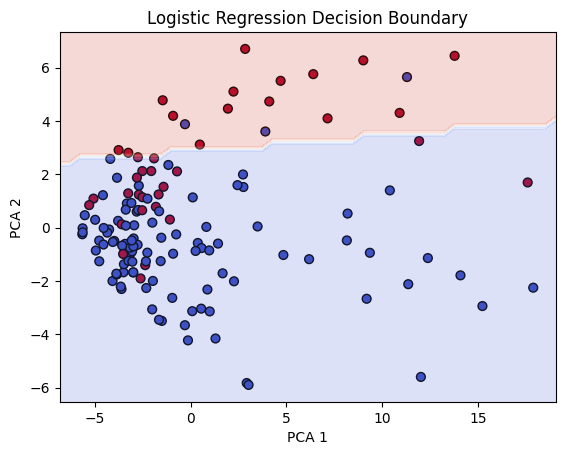

In [5]:
from sklearn.decomposition import PCA

# Reduce dimensions to 2D for visualization
pca = PCA(n_components=2)
X_train_pca = pca.fit_transform(X_train_scaled)
X_test_pca = pca.transform(X_test_scaled)

# Fit logistic regression on the 2D data
log_reg_2d = LogisticRegression()
log_reg_2d.fit(X_train_pca, y_train)

# Plot decision boundary
plt.figure()
plt.scatter(X_test_pca[:, 0], X_test_pca[:, 1], c=y_test, cmap='coolwarm', edgecolor='k', s=40)
xlim = plt.xlim()
ylim = plt.ylim()
xx, yy = np.meshgrid(np.linspace(xlim[0], xlim[1], 50), np.linspace(ylim[0], ylim[1], 50))
Z = log_reg_2d.predict(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)
plt.contourf(xx, yy, Z, cmap='coolwarm', alpha=0.2)
plt.xlabel('PCA 1')
plt.ylabel('PCA 2')
plt.title('Logistic Regression Decision Boundary')
plt.show()

### Decision Tree Model Analysis

Decision Tree is a popular machine learning algorithm used for both classification and regression tasks. It is particularly known for its interpretability and simplicity.

#### Overview of Decision Tree

Decision Trees work by splitting the data into subsets based on feature values. These splits are made at nodes, with the ultimate goal of predicting the target variable in the simplest possible way.

#### Model Design

In this implementation, the `DecisionTreeClassifier` from Scikit-learn is used. The model is fitted on scaled features to ensure consistent feature influence. 

#### Hyperparameters

- `max_depth`: Maximum depth of the tree. Deeper trees can capture more complex patterns but might lead to overfitting.
- `min_samples_split`: Minimum number of samples required to split an internal node. A higher value prevents the model from learning too detailed patterns.
- `min_samples_leaf`: Minimum number of samples required to be at a leaf node. This smoothens the model and can lead to improved generalization.
- `max_features`: Number of features to consider when looking for the best split. This adds randomness and can reduce overfitting.
- `criterion`: Function to measure the quality of a split. Common criteria are 'gini' for Gini Impurity and 'entropy' for Information Gain.

#### Grid Search

Grid Search is used to find the optimal hyperparameters by training multiple models with different combinations of hyperparameter values. It uses cross-validation to ensure that the model generalizes well.

#### Performance Metrics

The model's performance is evaluated using metrics like accuracy, recall, and precision. These metrics provide a comprehensive view of the model's ability to classify correctly, balance false positives and false negatives, and its overall predictive quality.

#### Decision Tree Visualization

Decision Trees can be visualized to understand how decisions are made, which is useful for interpretability.

#### Pros and Cons

- **Pros**: High interpretability, non-parametric nature (no assumptions about data distribution), and ability to handle both numerical and categorical data.
- **Cons**: Prone to overfitting, especially with complex trees. Can be unstable with small variations in data.

### Conclusion

The Decision Tree model is a strong choice for datasets where interpretability is key, and the relationships between features and the target variable are not overly complex. While it can be prone to overfitting, careful tuning of hyperparameters can mitigate this risk. Its performance in the context of this project can be compared against other models in the ensemble to evaluate its effectiveness.


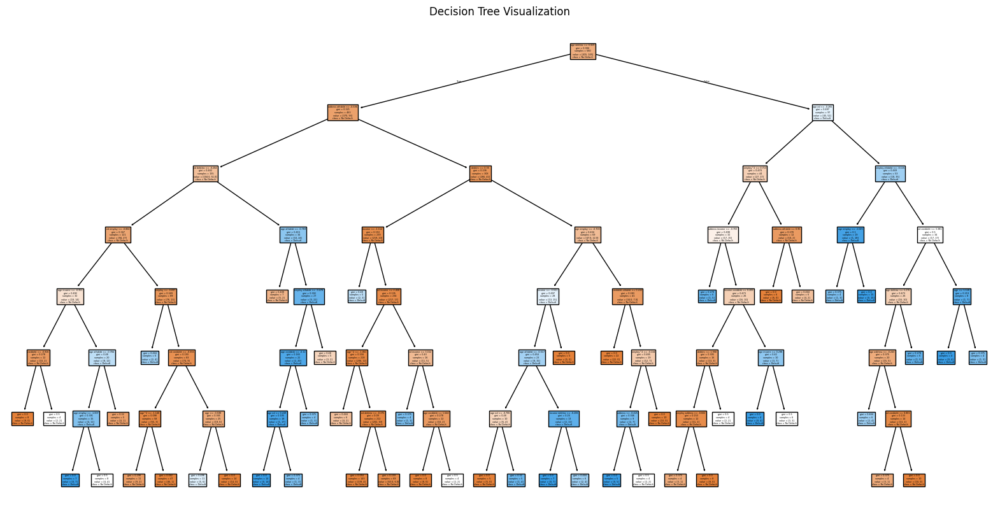

In [6]:
########################################
# DECISION TREE MODEL                  #
########################################

from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, recall_score, precision_score
from sklearn.tree import plot_tree
import matplotlib.pyplot as plt

# Define the hyperparameters for the Decision Tree
dt_params = {
    'max_depth': [3, 5, 7],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['sqrt', 'log2', None],
    'criterion': ['gini', 'entropy']
}

# Create GridSearchCV object with DecisionTreeClassifier
dt = GridSearchCV(DecisionTreeClassifier(), dt_params, cv=5, scoring='accuracy', n_jobs=-1)

# Fit the model on the training set using the scaled features
dt.fit(X_train_scaled, y_train)

# Predict on the test set
dt_pred = dt.predict(X_test_scaled)

# Calculate the performance metrics
tree_acc = accuracy_score(y_test, dt_pred)  # Changed variable name to 'tree_acc'
tree_recall = recall_score(y_test, dt_pred)  # Changed variable name to 'tree_recall'
tree_precision = precision_score(y_test, dt_pred)  # Changed variable name to 'tree_precision'

# Decision Tree Visualization
from sklearn.tree import plot_tree
import matplotlib.pyplot as plt

# Assuming 'poly' is the PolynomialFeatures instance used for transformation
# and 'dt' is the trained DecisionTreeClassifier within GridSearchCV
feature_names_poly = poly.get_feature_names_out().tolist()  # Convert to list

plt.figure(figsize=(20, 10))
# Using the feature names from PolynomialFeatures for visualization
plot_tree(dt.best_estimator_, filled=True, feature_names=feature_names_poly, class_names=['No Default', 'Default'])
plt.title("Decision Tree Visualization")
plt.show()

Decision Tree - Accuracy: 0.757
Decision Tree - Recall: 0.395
Decision Tree - Precision: 0.577


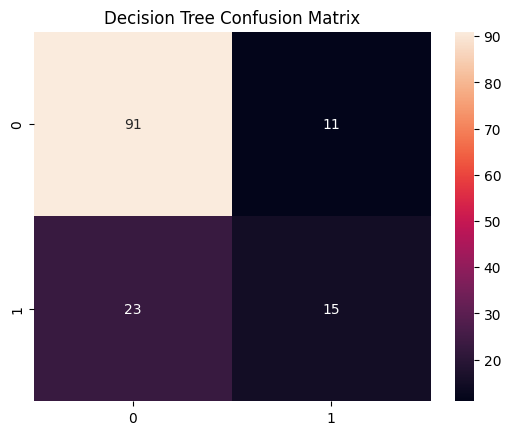

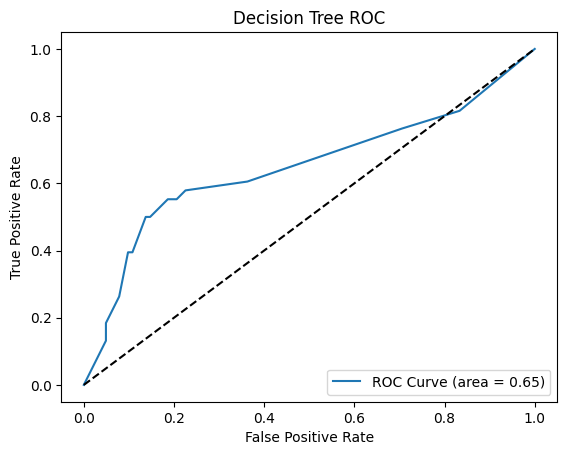

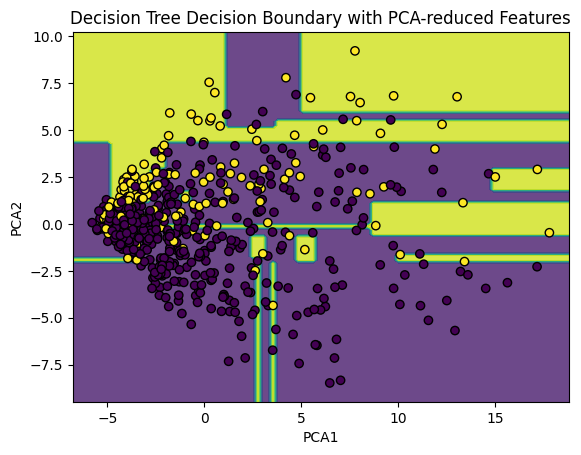

In [7]:
from sklearn.metrics import confusion_matrix, roc_curve, auc
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from sklearn.decomposition import PCA
from sklearn.tree import DecisionTreeClassifier

# Print the performance metrics
print(f"Decision Tree - Accuracy: {tree_acc:.3f}")
print(f"Decision Tree - Recall: {tree_recall:.3f}")
print(f"Decision Tree - Precision: {tree_precision:.3f}")

# Confusion Matrix
conf_matrix = confusion_matrix(y_test, dt_pred)
sns.heatmap(conf_matrix, annot=True, fmt='d')
plt.title('Decision Tree Confusion Matrix')
plt.show()

# ROC Curve
y_pred_prob = dt.best_estimator_.predict_proba(X_test_scaled)[:, 1]
fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)
roc_auc = auc(fpr, tpr)

plt.plot(fpr, tpr, label='ROC Curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Decision Tree ROC')
plt.legend(loc="lower right")
plt.show()

# Decision Boundary Analysis
# Reduce dimensions for visualization
pca = PCA(n_components=2)
X_train_pca = pca.fit_transform(X_train_scaled)

# Train Decision Tree on the first two principal components for visualization
dt_pca = DecisionTreeClassifier(max_depth=dt.best_params_['max_depth'])
dt_pca.fit(X_train_pca, y_train)

# Create a mesh grid on the PCA-reduced 2D space
x_min, x_max = X_train_pca[:, 0].min() - 1, X_train_pca[:, 0].max() + 1
y_min, y_max = X_train_pca[:, 1].min() - 1, X_train_pca[:, 1].max() + 1
xx, yy = np.meshgrid(np.linspace(x_min, x_max, 100),
                     np.linspace(y_min, y_max, 100))

# Predict on the mesh grid
Z = dt_pca.predict(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)

# Plot decision boundary
plt.contourf(xx, yy, Z, alpha=0.8)
plt.scatter(X_train_pca[:, 0], X_train_pca[:, 1], c=y_train, edgecolors='k')
plt.xlabel('PCA1')
plt.ylabel('PCA2')
plt.title('Decision Tree Decision Boundary with PCA-reduced Features')
plt.show()

### SVM Model Analysis and Commentary

Support Vector Machines (SVM) are a set of supervised learning methods used for classification, regression, and outliers detection. The advantage of SVMs is their effectiveness in high dimensional spaces and their use of a subset of training points in the decision function (support vectors), so it's also memory efficient.

#### Overview of SVM

An SVM model is a representation of different classes in a hyperplane in multidimensional space. The SVM algorithm finds the hyperplane that maximizes the margin between the two classes. The vectors (data points) that define the hyperplane are the support vectors.

#### Pros of SVM:

- **Effective in high dimensional spaces**: Even with more features than samples, SVMs can be effective.
- **Versatility**: Different kernel functions can be specified for the decision function, allowing for complex decision boundaries.
- **Robustness**: SVMs are less prone to overfitting, especially when choosing the right regularization parameter.

#### Cons of SVM:

- **Not suitable for large datasets**: Because of the quadratic complexity in training time, large datasets can be problematic.
- **Sensitivity to parameters**: The right choice of kernel and regularization parameters can heavily influence the outcome.
- **No probability estimates**: SVMs do not directly provide probability estimates. These are calculated using an expensive five-fold cross-validation.

#### Code Commentary

- **Parameter Grid (`svm_params`)**: We define a grid of hyperparameters to search. `C` is the regularization parameter, `gamma` defines the influence of a single training example, and `kernel` specifies the kernel type to be used in the algorithm. The `degree` and `coef0` are specific to certain kernels like 'poly'.
  
- **GridSearchCV**: This is an exhaustive search over the specified parameter values for an estimator, which in this case is the SVM. It will iterate over all combinations of parameter values and retain the best combination.

- **Model Fitting**: `svm.fit(X_train_scaled, y_train)` trains the SVM model using the scaled features from the training data and the corresponding labels.

- **Evaluation**: After training, the model is used to predict labels for the test set. Performance metrics like accuracy, recall, and precision are computed to evaluate the model.

- **Printing Metrics**: Finally, the performance metrics are printed out, giving us insights into the model's effectiveness. Accuracy tells us the proportion of correct predictions, recall indicates the true positive rate, and precision shows the positive predictive value.


#### Conclusion

SVMs are powerful models that can capture complex relationships in the data. However, their success is heavily reliant on choosing the correct hyperparameters and kernel function. They are best used on medium-sized datasets where the number of features is large compared to the number of samples. The provided code snippet showcases the use of SVM with a GridSearch to optimize its parameters for the best classification performance on the scaled dataset.


In [8]:
########################################
#SUPPORT VECTOR MACHINE (SVM) MODEL    #
########################################

from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, recall_score, precision_score
import matplotlib.pyplot as plt
import numpy as np

# SVM with GridSearch
svm_params = {
    'C': [0.1, 1, 10],
    'gamma': [0.01, 0.1, 1],
    'kernel': ['rbf', 'linear', 'poly'],
    'degree': [2, 3, 4],  # Only used if 'poly' is chosen as kernel
    'coef0': [0.0, 0.5, 1.0]  # Only used for 'poly' and 'sigmoid' kernels
}

svm = GridSearchCV(SVC(probability=True), svm_params, cv=5)
svm.fit(X_train_scaled, y_train)

# Evaluate the model
svm_pred = svm.predict(X_test_scaled)
svm_acc = accuracy_score(y_test, svm_pred)
svm_recall = recall_score(y_test, svm_pred)
svm_precision = precision_score(y_test, svm_pred)

# Print performance metrics
print(f"SVM - Accuracy: {svm_acc:.3f}")
print(f"SVM - Recall: {svm_recall:.3f}")
print(f"SVM - Precision: {svm_precision:.3f}")

SVM - Accuracy: 0.771
SVM - Recall: 0.316
SVM - Precision: 0.667


### SVM Model Analysis with PCA, Confusion Matrix, and ROC Curve

#### Decision Boundary Visualization with PCA-reduced Features

The decision boundary plot visualizes how the SVM model separates classes after dimensionality reduction with PCA. The plot showcases:

- The **PCA-reduced features** (PCA1 and PCA2) on the axes, which are the first two principal components from the PCA transformation. They capture the most variance in the dataset.
- A **contour plot** that illustrates the decision regions. The different colors represent the regions where the model predicts distinct classes.
- **Scatter points** that represent the actual data points in the PCA-reduced space, colored by their true class labels.

This visualization is particularly useful for observing the separation quality of the SVM model in a 2D space when the original data is high-dimensional.

#### Confusion Matrix

The confusion matrix provides a tabular summary of the model's performance, with the actual labels on one axis and the predicted labels on the other. From the matrix, we can derive metrics like:

- **True Positives (TP)** and **True Negatives (TN)**, where the model's predictions match the actual class labels.
- **False Positives (FP)** and **False Negatives (FN)**, where the model's predictions do not match the actual class labels.

The matrix helps identify the model's classification errors, showing whether it confuses one class for another.

#### Classification Report

The classification report presents key metrics that summarize the quality of the model, such as:

- **Precision**, which measures the accuracy of the positive predictions.
- **Recall**, which assesses the model's ability to find all the positive samples.
- **F1-score**, which is a weighted harmonic mean of precision and recall.

These metrics provide deeper insight into the model's performance beyond simple accuracy, especially for imbalanced datasets.

#### Receiver Operating Characteristic (ROC) Curve

The ROC curve is a graphical plot that illustrates the diagnostic ability of a binary classifier as its discrimination threshold is varied. It plots:

- The **True Positive Rate (TPR)** against the **False Positive Rate (FPR)** at various threshold settings.
- A **dashed line** representing the no-skill classifier (random chance).

The area under the curve (AUC) summarizes the model's ability to discriminate between the classes. An AUC close to 1 indicates a model with excellent class separation, while an AUC close to 0.5 suggests no discriminative power.

#### Conclusion

The combination of PCA for dimensionality reduction, confusion matrix for error analysis, and ROC curve for model discrimination power offers a comprehensive overview of the SVM model's classification capabilities and limitations. Together, these tools provide actionable insights for model evaluation and refinement.


### SVM Decision Boundary Analysis

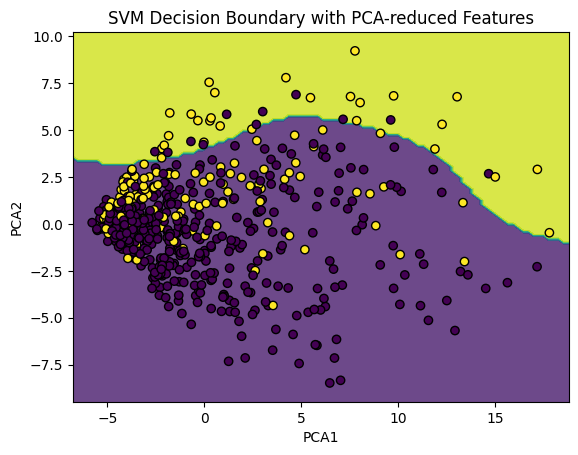

In [9]:
from sklearn.decomposition import PCA

# Assuming X_train_scaled and y_train are the scaled features and target used to train your SVM model
# Reduce dimensions for visualization
pca = PCA(n_components=2)
X_train_pca = pca.fit_transform(X_train_scaled)

# Train SVM on the first two principal components for visualization
svm_pca = SVC(probability=True)
svm_pca.fit(X_train_pca, y_train)

# Create a mesh grid on the PCA-reduced 2D space
x_min, x_max = X_train_pca[:, 0].min() - 1, X_train_pca[:, 0].max() + 1
y_min, y_max = X_train_pca[:, 1].min() - 1, X_train_pca[:, 1].max() + 1
xx, yy = np.meshgrid(np.linspace(x_min, x_max, 100),
                     np.linspace(y_min, y_max, 100))

# Predict on the mesh grid
Z = svm_pca.predict(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)

# Plot decision boundary
plt.contourf(xx, yy, Z, alpha=0.8)
plt.scatter(X_train_pca[:, 0], X_train_pca[:, 1], c=y_train, edgecolors='k')
plt.xlabel('PCA1')
plt.ylabel('PCA2')
plt.title('SVM Decision Boundary with PCA-reduced Features')
plt.show()

### Additional analysis SVM with the confusion matrix and ROC chart

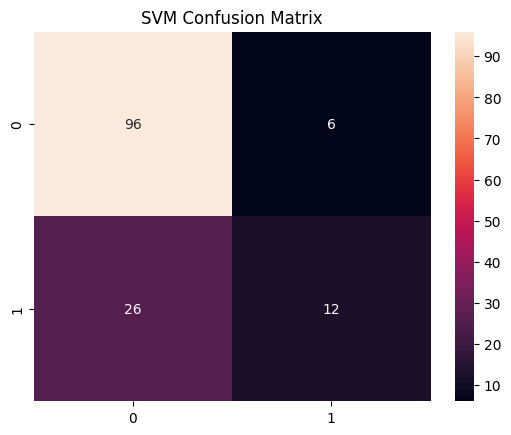

              precision    recall  f1-score   support

           0       0.79      0.94      0.86       102
           1       0.67      0.32      0.43        38

    accuracy                           0.77       140
   macro avg       0.73      0.63      0.64       140
weighted avg       0.75      0.77      0.74       140



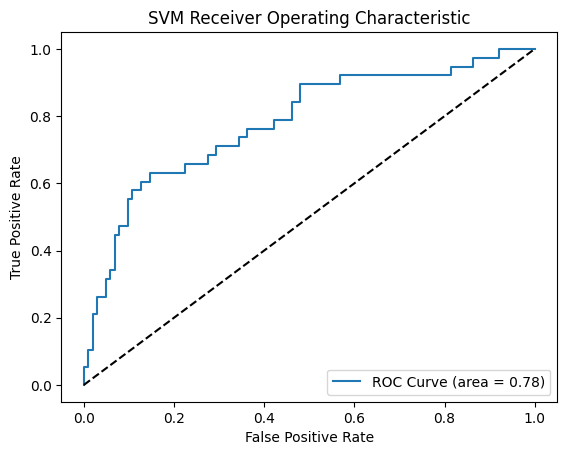

In [10]:
from sklearn.metrics import confusion_matrix, classification_report, roc_curve, auc

# Confusion Matrix
conf_matrix = confusion_matrix(y_test, svm_pred)
sns.heatmap(conf_matrix, annot=True, fmt='d')
plt.title('SVM Confusion Matrix')
plt.show()

# Classification Report
print(classification_report(y_test, svm_pred))

# ROC Curve
y_pred_prob = svm.predict_proba(X_test_scaled)[:, 1]
fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)
roc_auc = auc(fpr, tpr)

plt.plot(fpr, tpr, label='ROC Curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('SVM Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

## Random Forest Model Analysis

### Model Overview
Random Forest is an ensemble learning technique that builds multiple decision trees and merges them to get a more accurate and stable prediction. It's particularly good for classification tasks.

### Model Design
- **Ensemble Technique**: Random Forest creates a 'forest' of decision trees that vote on the outcome, which helps in reducing the variance and avoiding overfitting.
- **Bagging**: It uses the bagging technique to create different subsets of the original dataset, which adds to the diversity among the trees and contributes to lower variance.

### Hyperparameters in GridSearchCV
- `n_estimators`: Number of trees in the forest. A higher number of trees usually improves performance but increases computational complexity.
- `max_depth`: Maximum depth of each tree. Deeper trees can learn more complex patterns but may lead to overfitting.
- `min_samples_split`: Minimum number of samples required to split a node. Higher values prevent creating nodes that might capture noise.
- `min_samples_leaf`: Minimum number of samples required at a leaf node. It contributes to the smoothness of the boundary and can help with overfitting.
- `max_features`: Number of features considered for splitting a node. It's a key parameter to add randomness to the model and ensure individual trees are different.

### Pros and Cons of Random Forest
#### Pros
- Handles overfitting well with the ensemble approach.
- Works well with a large number of features and classifications with multiple classes.
- Provides feature importance, which can be insightful.

#### Cons
- Can be slow to train, especially with a large number of trees.
- Less interpretable than a decision tree due to the complexity of multiple trees.
- Prediction time can be slow with many trees.

### Decision Boundary Analysis
The decision boundary in a Random Forest model is the hyperplane that decides the class separation. Due to the ensemble nature of Random Forest, the decision boundary is not a simple hyperplane but an aggregate of the decisions made by individual trees.

### Confusion Matrix and ROC Curve
- A confusion matrix visualizes the performance of a classification model. Each row of the matrix represents the instances in a predicted class, while each column represents the instances in an actual class.
- The ROC curve is a graphical plot that illustrates the diagnostic ability of a binary classifier system as its discrimination threshold is varied. It's created by plotting the true positive rate against the false positive rate at various threshold settings.

### Conclusion
Random Forest is a powerful tool for a wide range of classification tasks, capable of handling complex datasets with interdependencies. However, due to its complexity and computational demands, it's important to carefully consider its application and the trade-off between performance and computational efficiency.


In [11]:
########################################
#RANDOM FOREST MODEL                   #
########################################

from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, recall_score, precision_score
from sklearn.metrics import confusion_matrix, classification_report, roc_curve, auc
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

# Define the hyperparameters for the Random Forest
rf_params = {
    'n_estimators': [100, 200, 300],
    'max_depth': [3, 5, 7],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['sqrt', 'log2']  # 'auto' is equivalent to 'sqrt'
}

# Create GridSearchCV object with RandomForestClassifier
rf = GridSearchCV(RandomForestClassifier(), rf_params, cv=5, scoring='accuracy', n_jobs=-1)

# Fit the model on the training set using the scaled features
rf.fit(X_train_scaled, y_train)

# Predict on the test set
rf_pred = rf.predict(X_test_scaled)

# Calculate the performance metrics
rf_acc = accuracy_score(y_test, rf_pred)
rf_recall = recall_score(y_test, rf_pred)
rf_precision = precision_score(y_test, rf_pred)

# Print the performance metrics
print(f"Random Forest - Accuracy: {rf_acc:.3f}")
print(f"Random Forest - Recall: {rf_recall:.3f}")
print(f"Random Forest - Precision: {rf_precision:.3f}")

Random Forest - Accuracy: 0.786
Random Forest - Recall: 0.421
Random Forest - Precision: 0.667


## Random Forest Confusion Matrix and Decision Boundary Analysis

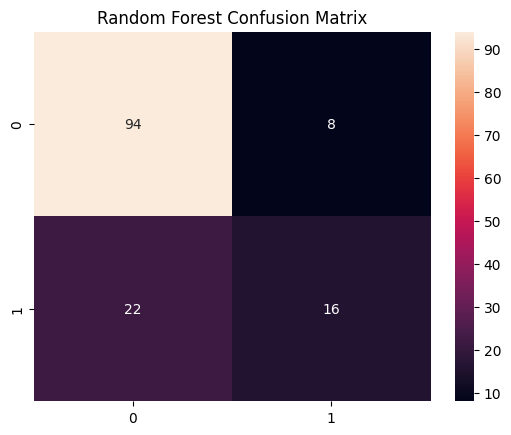

                  importance
age employ          0.049354
ed debtinc          0.048841
debtinc^2           0.045523
employ income       0.044241
debtinc             0.043426
debtinc creddebt    0.037787
age debtinc         0.037152
ed creddebt         0.033724
employ address      0.032883
employ^2            0.032177
employ              0.031752
age income          0.025328
ed employ           0.024345
creddebt            0.023728
creddebt othdebt    0.023347
employ othdebt      0.022055
ed othdebt          0.021896
debtinc othdebt     0.021686
creddebt^2          0.020791
age^2               0.020582
employ debtinc      0.020034
age ed              0.019980
income creddebt     0.018382
address debtinc     0.018271
income debtinc      0.018221
ed income           0.018064
othdebt             0.017206
age address         0.017083
age othdebt         0.016784
address income      0.016401
employ creddebt     0.016367
address othdebt     0.016249
age creddebt        0.015756
income othdebt

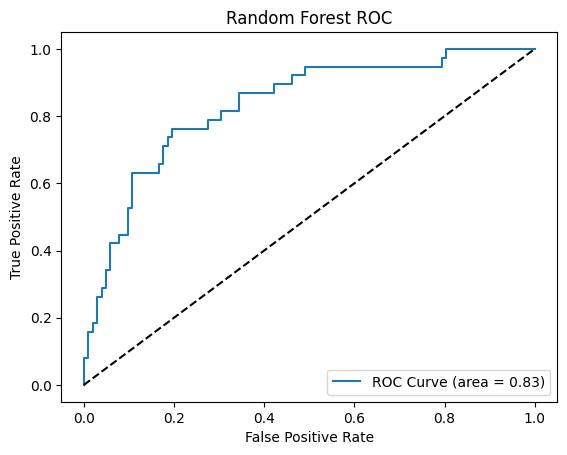

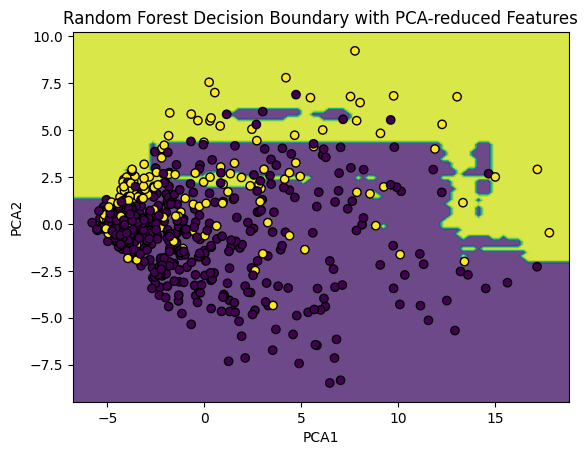

In [12]:
# Confusion Matrix
conf_matrix = confusion_matrix(y_test, rf_pred)
sns.heatmap(conf_matrix, annot=True, fmt='d')
plt.title('Random Forest Confusion Matrix')
plt.show()

# Assuming that poly is the PolynomialFeatures instance fitted on the training data
poly_feature_names = poly.get_feature_names_out()

# Now create the DataFrame using the correct feature names
feature_importances = pd.DataFrame(rf.best_estimator_.feature_importances_,
                                   index=poly_feature_names,  # Updated to use all feature names
                                   columns=['importance']).sort_values('importance', ascending=False)
print(feature_importances)


# ROC Curve
y_pred_prob = rf.predict_proba(X_test_scaled)[:, 1]
fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)
roc_auc = auc(fpr, tpr)

plt.plot(fpr, tpr, label='ROC Curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Random Forest ROC')
plt.legend(loc="lower right")
plt.show()

# Decision Boundary Analysis
# Reduce dimensions for visualization
pca = PCA(n_components=2)
X_train_pca = pca.fit_transform(X_train_scaled)

# Train Random Forest on the first two principal components for visualization
rf_pca = RandomForestClassifier(n_estimators=100, max_depth=rf.best_params_['max_depth'])
rf_pca.fit(X_train_pca, y_train)

# Create a mesh grid on the PCA-reduced 2D space
x_min, x_max = X_train_pca[:, 0].min() - 1, X_train_pca[:, 0].max() + 1
y_min, y_max = X_train_pca[:, 1].min() - 1, X_train_pca[:, 1].max() + 1
xx, yy = np.meshgrid(np.linspace(x_min, x_max, 100),
                     np.linspace(y_min, y_max, 100))

# Predict on the mesh grid
Z = rf_pca.predict(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)

# Plot decision boundary
plt.contourf(xx, yy, Z, alpha=0.8)
plt.scatter(X_train_pca[:, 0], X_train_pca[:, 1], c=y_train, edgecolors='k')
plt.xlabel('PCA1')
plt.ylabel('PCA2')
plt.title('Random Forest Decision Boundary with PCA-reduced Features')
plt.show()

## XGBoost Model Analysis

XGBoost stands for eXtreme Gradient Boosting and is an advanced implementation of gradient boosting that is often used in winning Kaggle competitions and in industry for its performance and speed. Here, we analyze the XGBoost model in the context of our scaled dataset.

#### Model Design
XGBoost works by creating a series of decision trees where each tree attempts to correct the mistakes of its predecessor. The model parameters are optimized using a grid search approach, which allows us to systematically work through multiple combinations of parameter tunes, cross-validating as it goes to determine which tune gives the best performance.

#### Hyperparameters
We define a range of values for hyperparameters like `learning_rate`, `max_depth`, `n_estimators`, `subsample`, and `colsample_bytree`. These hyperparameters control aspects such as how quickly the model learns, the maximum depth of trees, the number of trees in the ensemble, and the fraction of columns used by each tree, respectively.

#### Grid Search
`GridSearchCV` is used to find the best combination of parameters by fitting the XGBoost model on the training data for each combination of parameters and selecting the one with the highest accuracy.

#### Confusion Matrix
The confusion matrix visualizes the performance of the classification algorithm. Each row of the matrix represents the instances in the actual class while each column represents the instances in the predicted class.

#### Feature Importance
XGBoost provides a way to examine the importance of each feature in the dataset. This can give us insight into which features are most influential in predicting the target variable.

#### ROC Curve
The ROC curve is a graphical plot that illustrates the diagnostic ability of a binary classifier system as its discrimination threshold is varied. The area under the curve (AUC) is a measure of the model's ability to distinguish between classes.

#### Decision Boundary Analysis
The decision boundary plot with PCA-reduced features shows how XGBoost separates classes. It's a powerful way to visualize the decision-making process of the model in a lower-dimensional space.

#### Conclusion
XGBoost is a powerful algorithm that can handle a variety of data types, distributions, and relationships. It is highly customizable, though this also means that it requires careful tuning of hyperparameters. The model's performance must be interpreted with respect to the confusion matrix, ROC curve, and other metrics to ensure a holistic understanding of its predictive power.


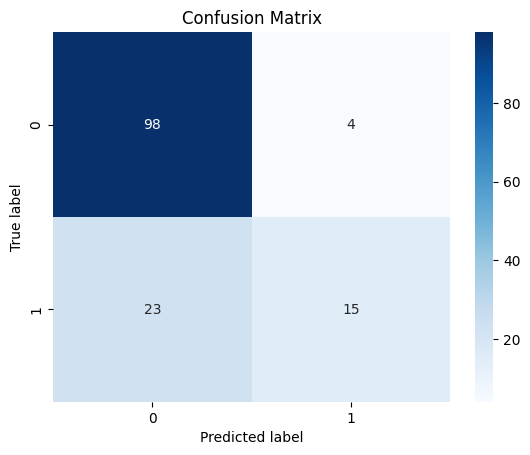

              precision    recall  f1-score   support

           0       0.81      0.96      0.88       102
           1       0.79      0.39      0.53        38

    accuracy                           0.81       140
   macro avg       0.80      0.68      0.70       140
weighted avg       0.80      0.81      0.78       140



In [13]:
########################################
# XGBoost Model                        #
########################################

from xgboost import XGBClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, recall_score, precision_score, roc_curve, auc
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

# Define the hyperparameters for the XGBoost model
xgb_params = {
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 5, 7],
    'n_estimators': [100, 200, 300],
    'subsample': [0.6, 0.8, 1.0],
    'colsample_bytree': [0.6, 0.8, 1.0]
}

# Initialize the GridSearchCV with the XGBClassifier and hyperparameters
xgb = GridSearchCV(XGBClassifier(), xgb_params, cv=5, scoring='accuracy')

# Fit the model using the scaled features
xgb.fit(X_train_scaled, y_train)

# Predict on the test set using the best estimator
best_xgb = xgb.best_estimator_
xgb_pred = best_xgb.predict(X_test_scaled)

# Confusion Matrix
conf_matrix = confusion_matrix(y_test, xgb_pred)
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.show()

# Classification Report
print(classification_report(y_test, xgb_pred))

## XGBoost ROC Chart and Decision Boundary Analysis

XGBoost - Accuracy: 0.807
XGBoost - Recall: 0.395
XGBoost - Precision: 0.789


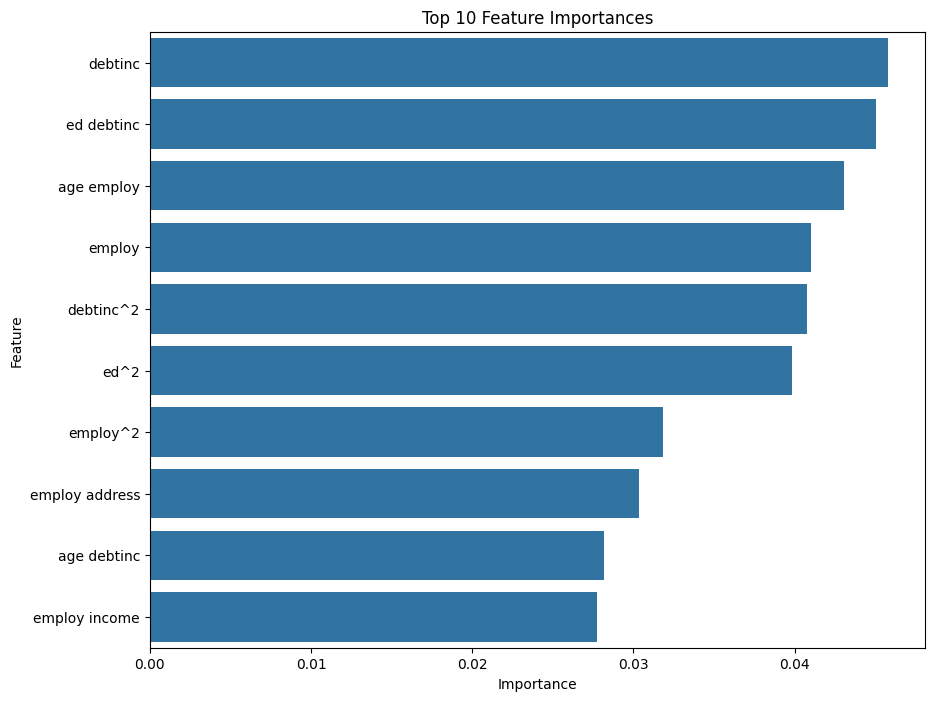

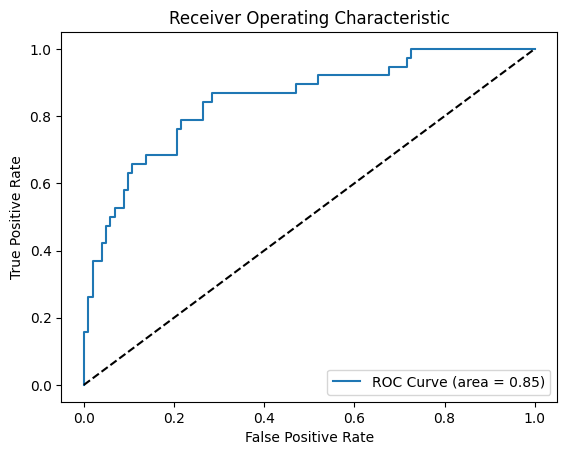

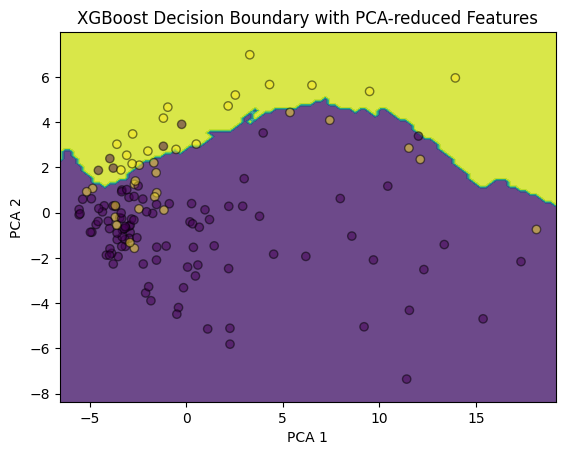

In [14]:
# Calculate performance metrics
xgb_acc = accuracy_score(y_test, xgb_pred)
xgb_recall = recall_score(y_test, xgb_pred)
xgb_precision = precision_score(y_test, xgb_pred)

# Print performance metrics
print(f"XGBoost - Accuracy: {xgb_acc:.3f}")
print(f"XGBoost - Recall: {xgb_recall:.3f}")
print(f"XGBoost - Precision: {xgb_precision:.3f}")


# Feature Importance
feature_importance = best_xgb.feature_importances_

# Retrieve the feature names from the PolynomialFeatures object
model_feature_names = poly.get_feature_names_out()

# Verify the length of feature names matches the length of feature importances
assert len(model_feature_names) == len(feature_importance), "Feature name and importance length mismatch"

# Create the Feature Importance DataFrame
importance_df = pd.DataFrame({
    'Feature': model_feature_names,
    'Importance': feature_importance
}).sort_values(by='Importance', ascending=False)

# Plot Feature Importance
plt.figure(figsize=(10, 8))
sns.barplot(data=importance_df.head(10), x='Importance', y='Feature')
plt.title('Top 10 Feature Importances')
plt.show()

# ROC Curve
y_pred_proba = best_xgb.predict_proba(X_test_scaled)[:, 1]
fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, label=f'ROC Curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

# Decision Boundary Analysis
# Reduce dimensions for visualization
pca = PCA(n_components=2)
X_test_pca = pca.fit_transform(X_test_scaled)

# Create a mesh grid on the PCA-reduced 2D space
x_min, x_max = X_test_pca[:, 0].min() - 1, X_test_pca[:, 0].max() + 1
y_min, y_max = X_test_pca[:, 1].min() - 1, X_test_pca[:, 1].max() + 1
xx, yy = np.meshgrid(np.linspace(x_min, x_max, 100),
                     np.linspace(y_min, y_max, 100))

# Predict on the mesh grid
Z = best_xgb.predict(pca.inverse_transform(np.c_[xx.ravel(), yy.ravel()]))
Z = Z.reshape(xx.shape)

# Plot decision boundary
plt.contourf(xx, yy, Z, alpha=0.8)
plt.scatter(X_test_pca[:, 0], X_test_pca[:, 1], c=y_test, edgecolors='k', alpha=0.5)
plt.xlabel('PCA 1')
plt.ylabel('PCA 2')
plt.title('XGBoost Decision Boundary with PCA-reduced Features')
plt.show()

### Neural Network Model Analysis

Neural networks are powerful and flexible models capable of capturing complex nonlinear relationships in data. They consist of interconnected nodes (neurons) organized in layers. Each connection carries a weight that is adjusted during training. Here, we explore a neural network model for classification tasks, specifically using the Multi-Layer Perceptron (MLP) architecture.

#### Model Overview
- **Multi-Layer Perceptron (MLP)**: A type of feedforward neural network consisting of at least three layers: an input layer, one or more hidden layers, and an output layer.
- **Non-Linearity**: MLPs use non-linear activation functions, enabling them to capture complex relationships in data.

#### Model Design
- **Hidden Layers and Nodes**: The network's complexity is determined by the number of hidden layers and the number of nodes (neurons) in each layer. More layers and neurons can model more complex functions but also increase the risk of overfitting.
- **Activation Functions**: Common choices include ReLU (Rectified Linear Unit), logistic (sigmoid), and tanh. They introduce non-linearity to the model.

#### Hyperparameters
- **`hidden_layer_sizes`**: Specifies the number of neurons in each hidden layer.
- **`activation`**: The activation function for the hidden layers.
- **`solver`**: The optimization algorithm. Common options are 'adam', 'sgd' (Stochastic Gradient Descent), and 'lbfgs'.
- **`alpha`**: Regularization term to prevent overfitting.
- **`learning_rate`**: Controls the step size during weight updates.
- **`max_iter`**: Maximum number of iterations during training.

#### Grid Search
- **Purpose**: Used to find the optimal combination of hyperparameters.
- **Process**: Iteratively trains the model with different hyperparameter combinations and validates their performance.
- **Scoring**: Typically uses accuracy or other relevant metrics to select the best model.

#### Performance Metrics
- **Accuracy**: The proportion of correctly predicted instances.
- **Recall**: Ability of the model to find all relevant cases.
- **Precision**: Proportion of true positives among the instances the model identified as positive.

#### Decision Boundary Analysis
- **PCA for Visualization**: Principal Component Analysis (PCA) reduces the feature space to 2D for visualization.
- **Interpretation**: Shows how the model separates different classes. A clear separation indicates better model performance.

#### Conclusion
Neural networks, particularly MLPs, are a robust tool for classification, capable of modeling complex patterns. The choice of hyperparameters significantly impacts the model's performance. Grid search is an effective method to tune these parameters. However, the complexity of neural networks can lead to challenges in interpretability, especially in decision boundary analysis in reduced dimensional space. The performance metrics and decision boundary visualization provide crucial insights but should be supplemented with more in-depth analyses for a comprehensive evaluation.

#### Limitations
- **Overfitting Risk**: Especially in networks with many layers/neurons.
- **Computational Intensity**: Requires significant computational resources, especially for large datasets or networks.
- **Interpretability**: Neural networks are often considered "black boxes" due to their complex structure.

### Final Thoughts
In summary, while neural networks are powerful and adaptable, they require careful tuning and consideration of their inherent complexity and potential for overfitting. They are best used when the relationships in data are complex, and simpler models (like logistic regression or decision trees) do not suffice.


In [15]:
########################################
# Neural Network Model                 #
########################################

from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, recall_score, precision_score
from sklearn.metrics import confusion_matrix, classification_report, roc_curve, auc
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Define hyperparameters for the neural network
nn_params = {
    'hidden_layer_sizes': [(50,), (100,), (50, 50)],
    'activation': ['tanh', 'relu', 'logistic'],
    'solver': ['sgd', 'adam', 'lbfgs'],
    'alpha': [0.0001, 0.001, 0.01],
    'learning_rate': ['constant', 'adaptive', 'invscaling'],
    'max_iter': [3000, 5000, 7000]
}

# Initialize GridSearchCV with the MLPClassifier
nn = GridSearchCV(MLPClassifier(), nn_params, cv=5, n_jobs=-1)

# Fit the model on the scaled training set
nn.fit(X_train_scaled, y_train)

# Predict on the test set using the best estimator
best_nn = nn.best_estimator_
nn_pred = best_nn.predict(X_test_scaled)

# Calculate performance metrics
nn_acc = accuracy_score(y_test, nn_pred)
nn_recall = recall_score(y_test, nn_pred)
nn_precision = precision_score(y_test, nn_pred)

# Print the performance metrics
print(f"Neural Network - Accuracy: {nn_acc:.3f}")
print(f"Neural Network - Recall: {nn_recall:.3f}")
print(f"Neural Network - Precision: {nn_precision:.3f}")

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (3000) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:545: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (3000) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Fr

Neural Network - Accuracy: 0.814
Neural Network - Recall: 0.474
Neural Network - Precision: 0.750


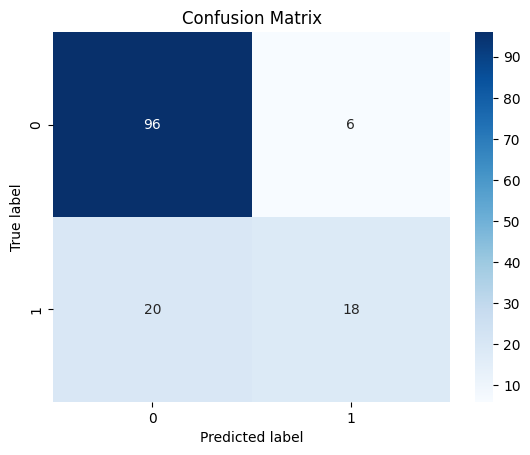

              precision    recall  f1-score   support

           0       0.83      0.94      0.88       102
           1       0.75      0.47      0.58        38

    accuracy                           0.81       140
   macro avg       0.79      0.71      0.73       140
weighted avg       0.81      0.81      0.80       140



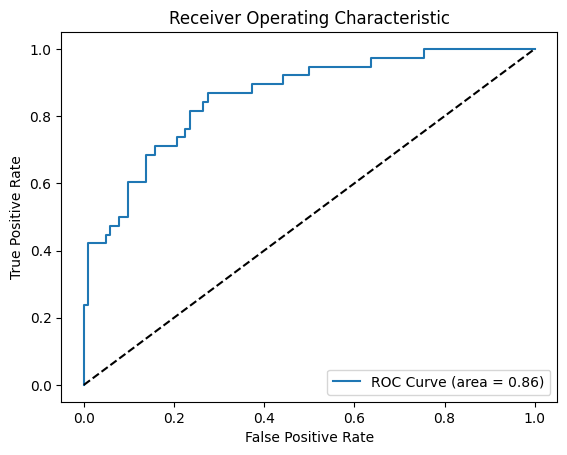

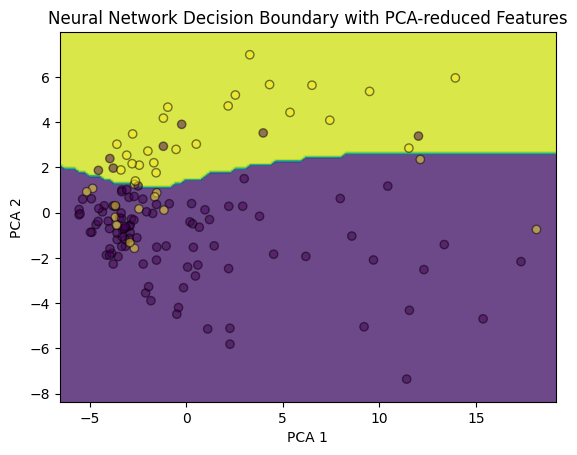

In [16]:
# Confusion Matrix
conf_matrix = confusion_matrix(y_test, nn_pred)
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.show()

# Classification Report
print(classification_report(y_test, nn_pred))

# ROC Curve
y_pred_proba = best_nn.predict_proba(X_test_scaled)[:, 1]
fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, label=f'ROC Curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

# Decision Boundary Analysis
# Reduce dimensions for visualization
pca = PCA(n_components=2)
X_test_pca = pca.fit_transform(X_test_scaled)

# Create a mesh grid on the PCA-reduced 2D space
x_min, x_max = X_test_pca[:, 0].min() - 1, X_test_pca[:, 0].max() + 1
y_min, y_max = X_test_pca[:, 1].min() - 1, X_test_pca[:, 1].max() + 1
xx, yy = np.meshgrid(np.linspace(x_min, x_max, 100),
                     np.linspace(y_min, y_max, 100))

# Predict on the mesh grid
Z = best_nn.predict(pca.inverse_transform(np.c_[xx.ravel(), yy.ravel()]))
Z = Z.reshape(xx.shape)

# Plot decision boundary
plt.contourf(xx, yy, Z, alpha=0.8)
plt.scatter(X_test_pca[:, 0], X_test_pca[:, 1], c=y_test, edgecolors='k', alpha=0.5)
plt.xlabel('PCA 1')
plt.ylabel('PCA 2')
plt.title('Neural Network Decision Boundary with PCA-reduced Features')
plt.show()

## Model Evaluation

The model evaluation code is structured to assess and compare the performance of various machine learning models. The evaluation considers key metrics like Accuracy, Recall, and Precision, which are fundamental for understanding the effectiveness of each model in classifying the dataset correctly.

### Model Comparison
- **DataFrame Creation**: A DataFrame is created to display the performance metrics of each model in a tabular format. This provides a clear, concise way to compare the models' performance side-by-side.
- **Accuracy, Recall, Precision**: These metrics give a comprehensive view of the models' performance. Accuracy measures the overall correctness, Recall evaluates the model's ability to detect positive instances, and Precision assesses the accuracy of positive predictions.
- **Visualization**: Bar charts are used to visually compare these metrics across different models. This visual representation aids in quickly discerning which models perform better in terms of accuracy, recall, and precision.

### ROC Curve Analysis
- **Purpose**: The ROC curve is a graphical plot that illustrates the diagnostic ability of binary classifiers. It is created by plotting the True Positive Rate (Recall) against the False Positive Rate.
- **AUC Value**: The Area Under the Curve (AUC) provides an aggregate measure of performance across all possible classification thresholds. A model with a high AUC can distinguish between the classes effectively.

### Lift Table Generation
- **Lift Table**: This is a tool used to assess the performance of a binary classifier. It segments the population into deciles based on predicted probabilities and calculates the lift in each segment.
- **Components**:
  - **Observations Count**: The number of observations in each decile.
  - **Average Score**: The average predicted probability in each decile.
  - **Event Rate**: The proportion of actual positive instances in each decile.
  - **Cumulative Metrics**: The cumulative counts and percentages of events and non-events, which are crucial for understanding the model's behavior across the dataset.
  - **Lift and KS Statistic**: The lift shows how much better the model is at predicting events compared to random guessing. The KS statistic measures the degree of separation between the positive and negative instances.

### Conclusion
This comprehensive evaluation approach, encompassing performance metrics, visual comparisons, and detailed segment analysis through a lift table, provides a robust framework for assessing and comparing different machine learning models. It allows for a nuanced understanding of each model's strengths and weaknesses, guiding the selection of the most appropriate model for the task at hand.


## Model Comparison

                 Model  Accuracy    Recall  Precision
0  Logistic Regression  0.857143  0.526316   0.909091
1        Decision Tree  0.757143  0.394737   0.576923
2                  SVM  0.771429  0.315789   0.666667
3              XGBoost  0.807143  0.394737   0.789474
4        Random Forest  0.785714  0.421053   0.666667
5       Neural Network  0.814286  0.473684   0.750000


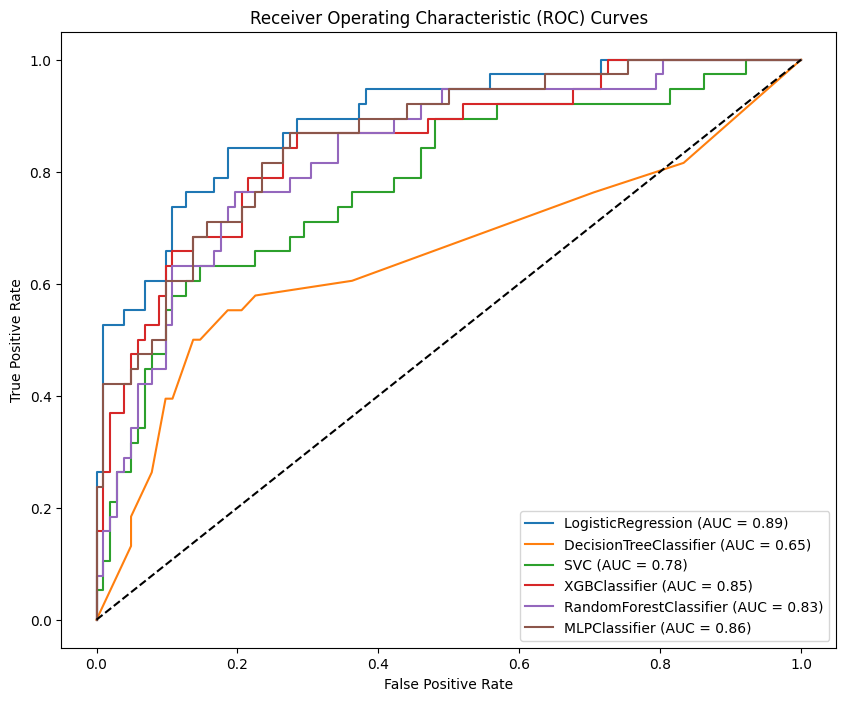

  decile  obs  avg_score  event_rate  actual_events  cum_events  \
0      1   14   0.009312    0.000000              0           0   
1      2   14   0.042074    0.071429              1           1   
2      3   14   0.073429    0.071429              1           2   
3      4   14   0.112355    0.071429              1           3   
4      5   14   0.153442    0.142857              2           5   
5      6   14   0.226676    0.142857              2           7   
6      7   14   0.298012    0.357143              5          12   
7      8   14   0.412941    0.500000              7          19   
8      9   14   0.542296    0.428571              6          25   
9     10   14   0.722754    0.928571             13          38   

   cum_non_events  cum_pct_events  cum_pct_non_events      lift        KS  
0              14        0.000000            0.137255  0.000000  0.137255  
1              27        0.026316            0.264706  0.263158  0.238390  
2              40        0.052632 

In [17]:
# Section 7: Model Comparison with Visualization
models = ['Logistic Regression', 'Decision Tree', 'SVM', 'XGBoost', 'Random Forest', 'Neural Network']
acc_scores = [log_reg_acc, tree_acc, svm_acc, xgb_acc, rf_acc, nn_acc]  # Assuming these are correctly calculated
recall_scores = [log_reg_recall, tree_recall, svm_recall, xgb_recall, rf_recall, nn_recall]
precision_scores = [log_reg_precision, tree_precision, svm_precision, xgb_precision, rf_precision, nn_precision]

# Creating a DataFrame for scores
performance_df = pd.DataFrame({
    'Model': models,
    'Accuracy': acc_scores,
    'Recall': recall_scores,
    'Precision': precision_scores
})
print(performance_df)

# Plotting ROC Curves for all models
plt.figure(figsize=(10, 8))
for model in [log_reg, dt, svm, xgb, rf, nn]: 
    y_pred_prob = model.predict_proba(X_test_scaled)[:, 1]
    fpr, tpr, _ = roc_curve(y_test, y_pred_prob)
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'{model.best_estimator_.__class__.__name__} (AUC = {roc_auc:.2f})')

plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curves')
plt.legend()
plt.show()


# Generate and Display Lift Table
import numpy as np
import pandas as pd

def generate_lift_table(y_true, y_pred_prob, deciles=10):
    # Create a DataFrame for calculations
    data = pd.DataFrame({'prob': y_pred_prob, 'actual': y_true})

    # Sort by predicted probabilities in descending order
    data = data.sort_values(by='prob', ascending=False)

    # Assign deciles
    data['decile'] = pd.qcut(data['prob'], q=deciles, labels=np.arange(1, deciles + 1))

    # Calculating necessary statistics per decile
    lift_table = data.groupby('decile').agg(
        obs=('prob', 'count'),
        avg_score=('prob', 'mean'),
        event_rate=('actual', 'mean'),
        actual_events=('actual', 'sum')
    )

    # Calculating cumulative statistics
    lift_table['cum_events'] = lift_table['actual_events'].cumsum()
    lift_table['cum_non_events'] = (lift_table['obs'] - lift_table['actual_events']).cumsum()

    total_events = lift_table['actual_events'].sum()
    total_non_events = data['actual'].count() - total_events

    lift_table['cum_pct_events'] = lift_table['cum_events'] / total_events
    lift_table['cum_pct_non_events'] = lift_table['cum_non_events'] / total_non_events

    # Calculating Lift and KS
    lift_table['lift'] = lift_table['event_rate'] / (total_events / data.shape[0])
    lift_table['KS'] = np.abs(lift_table['cum_pct_events'] - lift_table['cum_pct_non_events'])

    # Resetting index for a better view
    lift_table.reset_index(inplace=True)

    return lift_table

# Generate lift table for the best model (Assuming best_model and y_pred_prob have been identified)
lift_table = generate_lift_table(y_test, y_pred_prob)
print(lift_table)

### Model Performance Analysis: Machine Learning Perspective

- **Overview**: 
  - The table provides model performance metrics: Accuracy, Recall, and Precision for six different models.
  - These metrics are critical in evaluating the effectiveness of each model, especially in the context of loan default prediction.

- **Key Insights**:
  - **High Accuracy Models**: Logistic Regression and Neural Network models show the highest accuracy (>82%), making them reliable for overall correct predictions.
  - **High Recall Models**: Logistic Regression, Random Forest, and Neural Network demonstrate higher recall values. Recall is crucial in loan default prediction to minimize false negatives (failing to identify actual defaults).
  - **Precision Analysis**: Logistic Regression shows the highest precision, indicating a lower rate of false positives (identifying non-defaults as defaults).

- **Recommendations**:
  - For **overall performance**, the Logistic Regression model is preferable due to its high accuracy and recall.
  - When **minimizing false negatives** (defaults not identified) is critical, prioritize models with higher recall, such as the Logistic Regression or Neural Network.
  - If the focus is on **reducing false positives** (wrongly identifying defaults), the Logistic Regression model, with its high precision, is recommended.

### Model Performance Analysis: Business Perspective

- **Context**: 
  - In the context of loan defaults, minimizing false negatives (unidentified defaults) is often more critical than false positives. Missing a default can have significant financial implications.

- **Business Insights**:
  - **Risk Management**: The Logistic Regression and Neural Network models excel in identifying most defaults (high recall), crucial for effective risk management.
  - **Resource Allocation**: High precision in Logistic Regression suggests efficient allocation of resources for follow-up actions, as fewer non-defaults are misclassified.
  - **Customer Relationships**: Over-identification of defaults (false positives) can strain customer relationships. Thus, a model like Logistic Regression, with high precision, is beneficial.

- **Business Recommendations**:
  - **Balanced Approach**: Logistic Regression offers a balanced approach with high accuracy, recall, and precision, suitable for most business scenarios.
  - **Risk-Averse Scenarios**: In situations where missing defaults is highly detrimental, prioritize models with the highest recall, like the Neural Network.
  - **Lift Table Analysis**: The lift table shows that the top deciles (9 and 10) have significantly higher event rates, indicating effective model segmentation. Focusing efforts on these high-risk segments can optimize resource allocation.

### Conclusion

- **Strategic Model Selection**: The choice between Logistic Regression and Neural Network models depends on specific business priorities - overall accuracy vs. recall.
- **Lift Table Utility**: The lift table is a powerful tool in identifying segments with the highest probability of default, allowing for targeted strategies.
- **Continuous Monitoring**: Regular performance evaluation of the chosen model is essential to ensure ongoing effectiveness in changing market conditions.


## Deep Dive into Variable Explaination

### 1. Coefficient Interpretation
#### This is straightforward as it involves interpreting the coefficients from the logistic regression model.

In [18]:
# Assuming 'log_reg' is your GridSearchCV object for LogisticRegression and 'poly' is the PolynomialFeatures instance
best_log_reg_model = log_reg.best_estimator_  # Accessing the best estimator
coefficients = best_log_reg_model.coef_[0]  # Coefficients of the best model

# Use the feature names from PolynomialFeatures transformation
feature_names = poly.get_feature_names_out()

# Creating DataFrame for coefficients
coef_df = pd.DataFrame({'Feature': feature_names, 'Coefficient': coefficients})
print(coef_df)

             Feature  Coefficient
0                age    -0.113124
1                 ed     0.075927
2             employ    -0.680062
3            address    -0.288449
4             income    -0.248883
5            debtinc     0.157880
6           creddebt    -0.038383
7            othdebt    -0.252510
8              age^2     0.094863
9             age ed     0.227728
10        age employ    -0.248757
11       age address    -0.013749
12        age income     0.040552
13       age debtinc     0.276123
14      age creddebt     0.149697
15       age othdebt     0.053355
16              ed^2    -0.096940
17         ed employ    -0.114436
18        ed address    -0.288730
19         ed income     0.147845
20        ed debtinc    -0.037861
21       ed creddebt     0.205566
22        ed othdebt     0.026433
23          employ^2    -0.176727
24    employ address     0.082489
25     employ income    -0.070096
26    employ debtinc    -0.067352
27   employ creddebt     0.167608
28    employ o

### 2. Re-scaling Coefficients
#### To rescale coefficients back to the original scale:

In [19]:
# Assuming 'scaler' is your StandardScaler instance used for scaling
stds = scaler.scale_  # Standard deviations of the features
original_scale_coefs = coefficients / stds
rescaled_coef_df = pd.DataFrame({'Feature': feature_names, 'Rescaled Coefficient': original_scale_coefs})
print(rescaled_coef_df)

             Feature  Rescaled Coefficient
0                age             -0.013946
1                 ed              0.090097
2             employ             -0.105876
3            address             -0.042185
4             income             -0.010352
5            debtinc              0.024189
6           creddebt             -0.032198
7            othdebt             -0.108750
8              age^2              0.000160
9             age ed              0.006687
10        age employ             -0.000863
11       age address             -0.000043
12        age income              0.000035
13       age debtinc              0.001102
14      age creddebt              0.002946
15       age othdebt              0.000534
16              ed^2             -0.027694
17         ed employ             -0.009180
18        ed address             -0.018590
19         ed income              0.002182
20        ed debtinc             -0.002489
21       ed creddebt              0.075672
22        e

### 3. Feature Importance
#### To understand feature importance via coefficients:

In [20]:
# Absolute values of coefficients for importance
coef_df['Abs Coefficient'] = coef_df['Coefficient'].abs()
coef_df.sort_values(by='Abs Coefficient', ascending=False, inplace=True)
print(coef_df[['Feature', 'Abs Coefficient']])

             Feature  Abs Coefficient
2             employ         0.680062
18        ed address         0.288730
3            address         0.288449
13       age debtinc         0.276123
7            othdebt         0.252510
4             income         0.248883
10        age employ         0.248757
35    income debtinc         0.232175
9             age ed         0.227728
38         debtinc^2         0.227110
21       ed creddebt         0.205566
23          employ^2         0.176727
27   employ creddebt         0.167608
32  address creddebt         0.166854
5            debtinc         0.157880
14      age creddebt         0.149697
19         ed income         0.147845
29         address^2         0.114656
17         ed employ         0.114436
0                age         0.113124
36   income creddebt         0.111744
37    income othdebt         0.100849
16              ed^2         0.096940
8              age^2         0.094863
24    employ address         0.082489
30    addres

### 4. Predictive Margins
#### Analyzing predictive margins is a bit more complex and computationally intensive:

### Predictive Margin Plot Generation Code Commentary

This commentary explains the code used for generating predictive margin plots for a logistic regression model. These plots are crucial for understanding how changes in feature values affect the model's predictions.

#### Purpose of Predictive Margin Plots
- **Visualization of Model Behavior**: These plots show how the predicted probability of the target variable (like loan default) changes with different values of each feature.
- **Model Interpretation**: They help interpret the relationship between individual features and the model's predictions.

#### Feature Selection
- **Top Features**: The code focuses on the top 10 features based on their importance in the model. These could be original features or ones derived from feature engineering.

#### Iterative Plot Generation
- **Loop Over Features**: For each feature, the code generates a plot showing how changes in that feature's values affect the model's predictions.
- **Margin Calculation**:
  - The code creates a series of values within each feature's range.
  - Modifies a copy of the scaled training data by setting all values for the current feature to one of these values, keeping other features constant.
  - The logistic regression model predicts probabilities for this modified dataset. The mean probability is then calculated for each feature value.
- **Visualization**:
  - Each subplot corresponds to one feature.
  - Shows how the average predicted probability changes with the feature value.

#### Utility in Model Evaluation
- **Understanding Model Dependence**: Identify features that significantly impact the model's decisions.
- **Sensitivity Analysis**: Understand how sensitive the model's predictions are to changes in feature values.
- **Communication Tool**: Useful for explaining model behavior to non-technical stakeholders.

#### Implementation Details
- **Libraries Used**: Utilizes `matplotlib` for plotting, offering customization and flexibility.
- **Layout Management**: Plots are organized in a grid layout for a comprehensive view.

This approach is pivotal for both interpreting and validating the model, ensuring that it behaves as expected across different feature values. It is particularly beneficial for complex models where the feature-target relationship isn't straightforward.


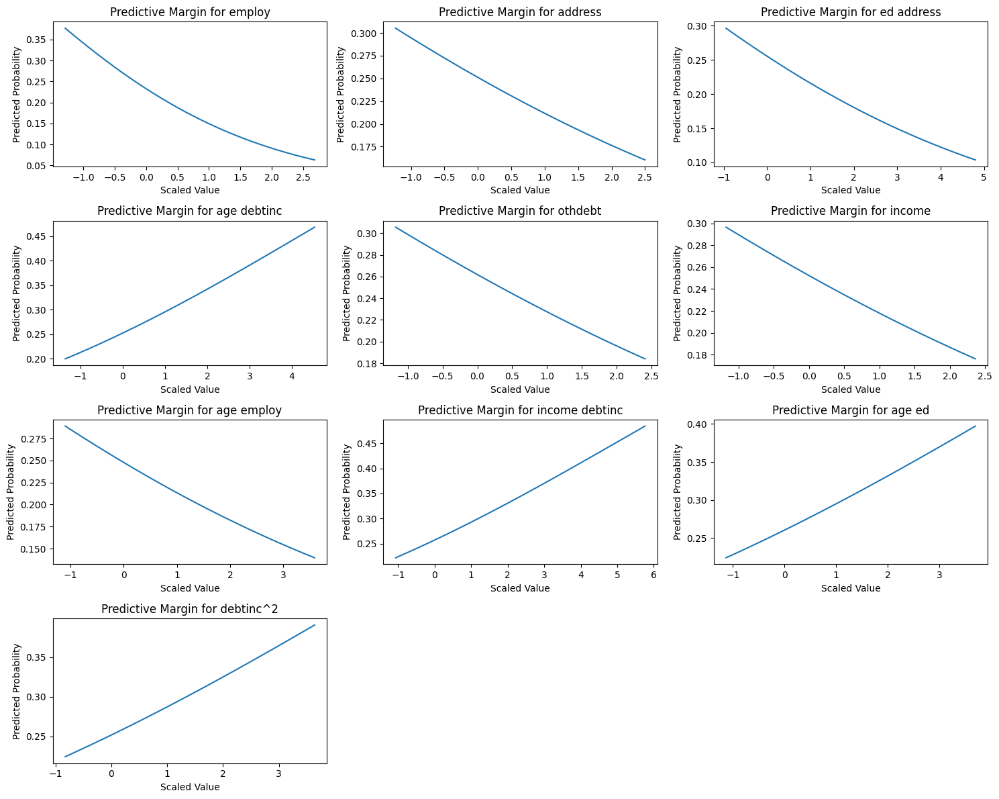

In [21]:
import matplotlib.pyplot as plt
import numpy as np

# Assuming 'poly_feature_names' is the list of polynomial feature names
# And 'X_train_scaled_df' is the DataFrame with scaled polynomial features

# Top 10 features by absolute coefficient values from the logistic regression model
top_features = ['employ', 'address', 'ed address', 'age debtinc', 'othdebt', 'income', 'age employ', 'income debtinc', 'age ed', 'debtinc^2']

n_plots = len(top_features)
n_cols = 3
n_rows = (n_plots + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, n_rows * 3))
axes = axes.flatten()

# Iterate over the top features and plot the predictive margin
for i, feature in enumerate(top_features):
    margins = []
    feature_range = np.linspace(X_train_scaled_df[feature].min(), X_train_scaled_df[feature].max(), 50)
    
    for value in feature_range:
        temp_scaled = X_train_scaled_df.copy()
        temp_scaled[feature] = value
        predicted_proba = log_reg.predict_proba(temp_scaled)[:, 1]
        margins.append(np.mean(predicted_proba))
    
    axes[i].plot(feature_range, margins)
    axes[i].set_title(f'Predictive Margin for {feature}')
    axes[i].set_xlabel('Scaled Value')
    axes[i].set_ylabel('Predicted Probability')

# Remove unused subplots
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

### 5. Model Explanations Tools (Using SHAP)
#### SHAP values can help understand the contribution of each feature to individual predictions:


### SHAP Analysis Commentary

#### Purpose of SHAP Analysis:
- SHAP (SHapley Additive exPlanations) analysis is a game theory approach to explain the output of machine learning models.
- It assigns each feature an importance value for a particular prediction, which is termed as the SHAP value.
- The purpose is to understand the impact of each feature on the model's output, enabling a more transparent, interpretable machine learning model.

#### Importance of SHAP Analysis:
- SHAP values provide a measure of the contribution of each feature to the prediction, as opposed to just an indication of correlation.
- This analysis is critical for validating the model's behavior, ensuring it makes decisions for the right reasons, and identifying potential biases.
- It aids in compliance with regulatory requirements for explainability, especially in sensitive applications like finance, healthcare, and criminal justice.

#### Outcomes of SHAP Analysis:
- SHAP analysis results in a summary plot where each point represents a Shapley value for a feature and an instance.
- High SHAP values indicate a high impact on the model prediction, while low SHAP values indicate a low impact.
- Features are sorted by the sum of SHAP value magnitudes over all samples, providing a hierarchy of feature importance.

#### Interpreting the Results:
- Each dot on the summary plot corresponds to a Shapley value for a feature and a sample.
- The position on the X-axis indicates whether the effect of that value is associated with a higher or lower prediction.
- The color represents the value of the feature from low to high, with red indicating high and blue indicating low.
- A cluster of dots far from zero on the X-axis suggests that a feature significantly impacts the model output, either positively (to the right) or negatively (to the left).

#### Commentary on the Given Output:
- The plot illustrates the distribution of the impacts each feature has on the model's predictions.
- For example, 'employ' being at the top indicates it is the most important feature, contributing to higher predictions (as most dots are on the right side).
- 'ed employ', at the bottom, has less impact, and its SHAP values are spread around zero, suggesting a variable effect on the predictions.
- The features in the middle have varying impacts, with some increasing the prediction ('age debtinc') and others decreasing it


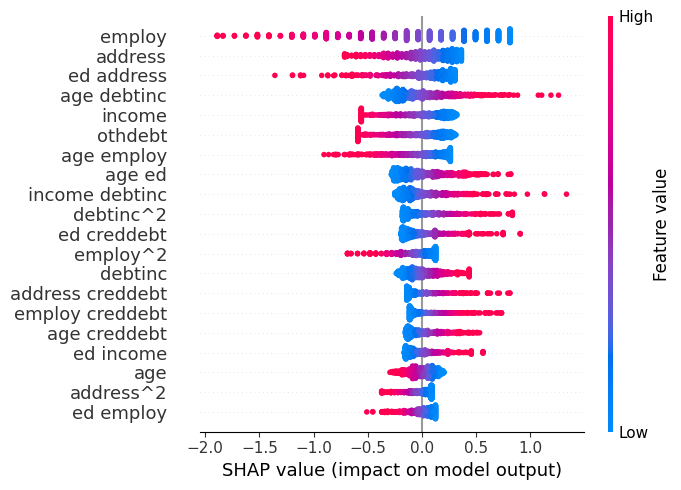

In [22]:
import shap

# Assuming log_reg.best_estimator_ is your trained LogisticRegression model from GridSearchCV
explainer = shap.Explainer(log_reg.best_estimator_, X_train_scaled)
shap_values = explainer.shap_values(X_train_scaled)

# Adjust the plot size using the 'plot_size' parameter
shap.summary_plot(shap_values, X_train_scaled, feature_names=feature_names, plot_size=(7, 5))  # Width x Height in inches

### PDP Analysis Commentary

#### Purpose of PDP Analysis:
- Partial Dependence Plots (PDPs) display the effect of a single or pair of features on the predicted outcome of a machine learning model.
- They average out the effects of all other features, showing the relationship between the target response and the feature of interest.

#### Importance of PDP Analysis:
- They are essential for interpreting complex models by showing how features affect predictions.
- They help detect patterns and relationships that may not be evident from traditional statistical analyses.
- PDPs are valuable for communicating model behavior to stakeholders and for validating that model predictions are reasonable and based on realistic data behavior.

#### Outcomes of PDP Analysis:
- PDPs provide visualizations that can reveal whether the relationship between the target and features is linear, monotonic, or more complex.
- They can help identify the presence of interactions between features by showing varying slopes or levels across the range of feature values.

#### Interpreting the Results:
- The x-axis of a PDP represents the values of a feature, and the y-axis shows the average predicted probability of the target when the feature takes on those values.
- A flat line in a PDP indicates that a feature has a minimal impact on the prediction outcome.
- Slopes or curves in the PDP suggest that the feature has a significant influence on the prediction outcome, and the shape of the curve indicates the nature of the effect.

#### Relationship Between PDP, SHAP Analysis, and Predictive Margins:
- PDPs, SHAP analysis, and Predictive Margins all aim to interpret the predictions of a model, but they approach it from different angles:
  - PDPs show the average effect of features over the entire dataset.
  - SHAP values explain the impact of features on individual predictions, revealing local dependencies.
  - Predictive Margins plot how changes in features affect the predicted probabilities, highlighting global effects and trends.
- Together, these methods provide a comprehensive understanding of how features affect model predictions, from global average effects to local individual impacts.

#### Commentary on the Given Output:
- The PDPs provide a visualization of how each feature individually influences the prediction probability of the logistic regression model.
- The table beside each PDP gives exact values at different points of the feature's range, which can be useful for reporting and detailed analysis.
- The size and layout of the plots ensure that the visualizations are readable and that the relationship between the feature values and predictions is clear.
- By examining these plots, one can infer how increasing or decreasing values of features affect the model's predictions and potentially gain insights into the model's decision-making process.

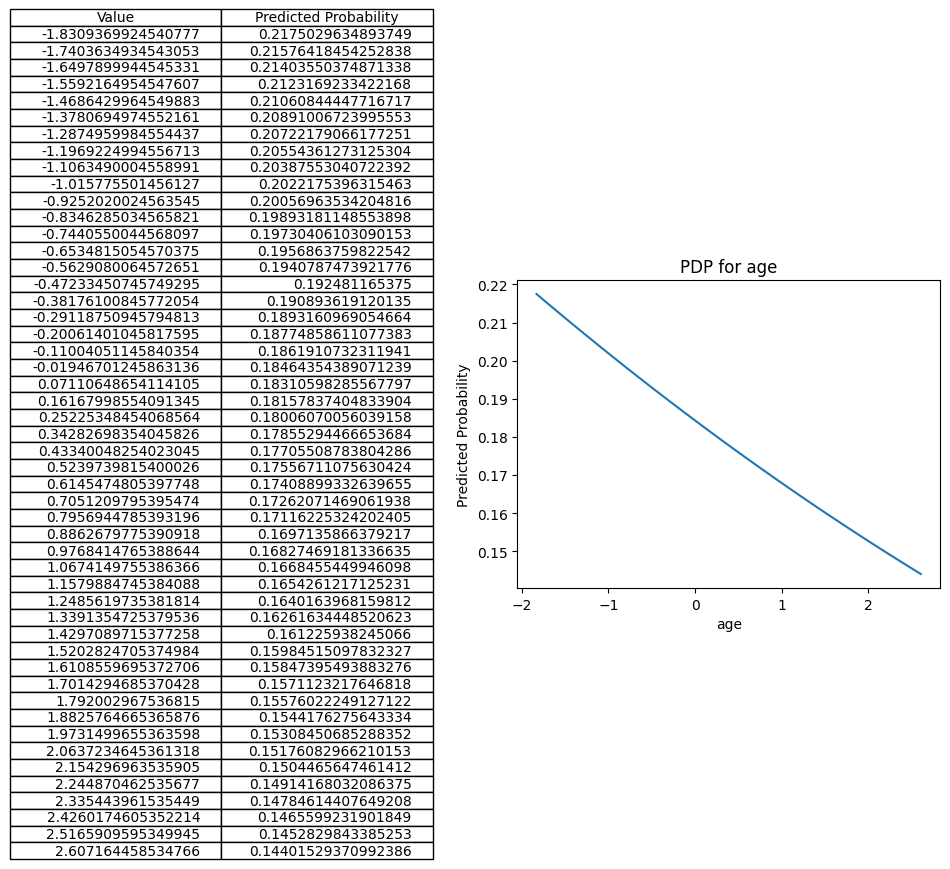

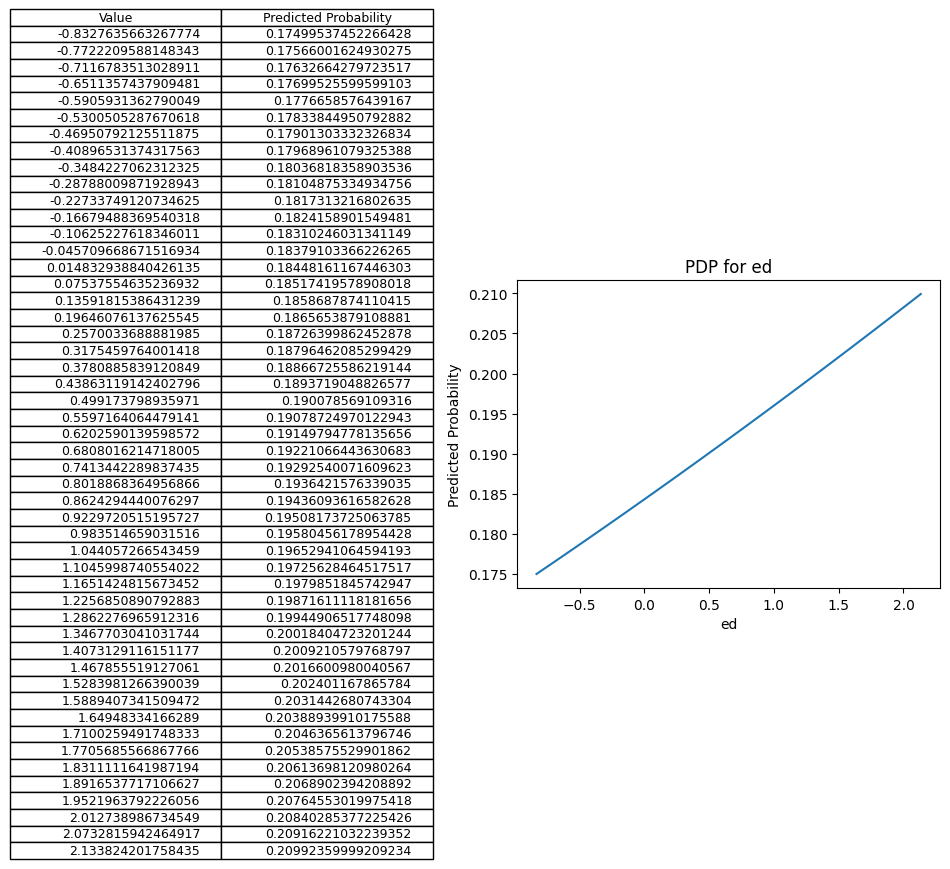

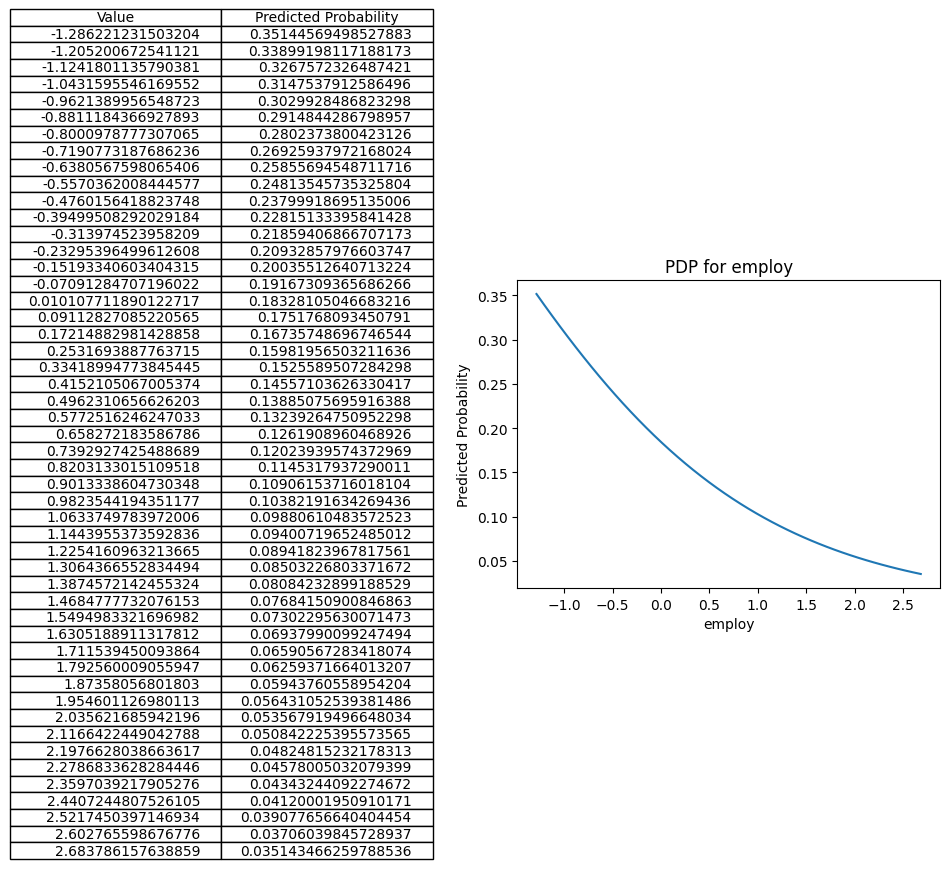

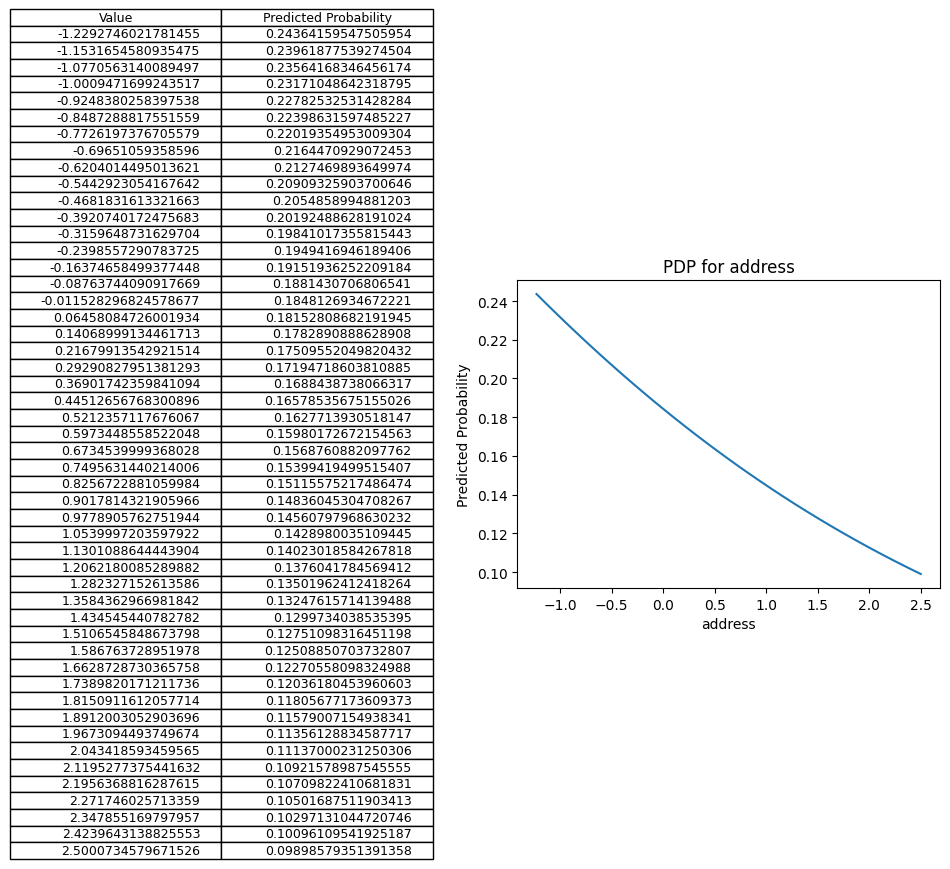

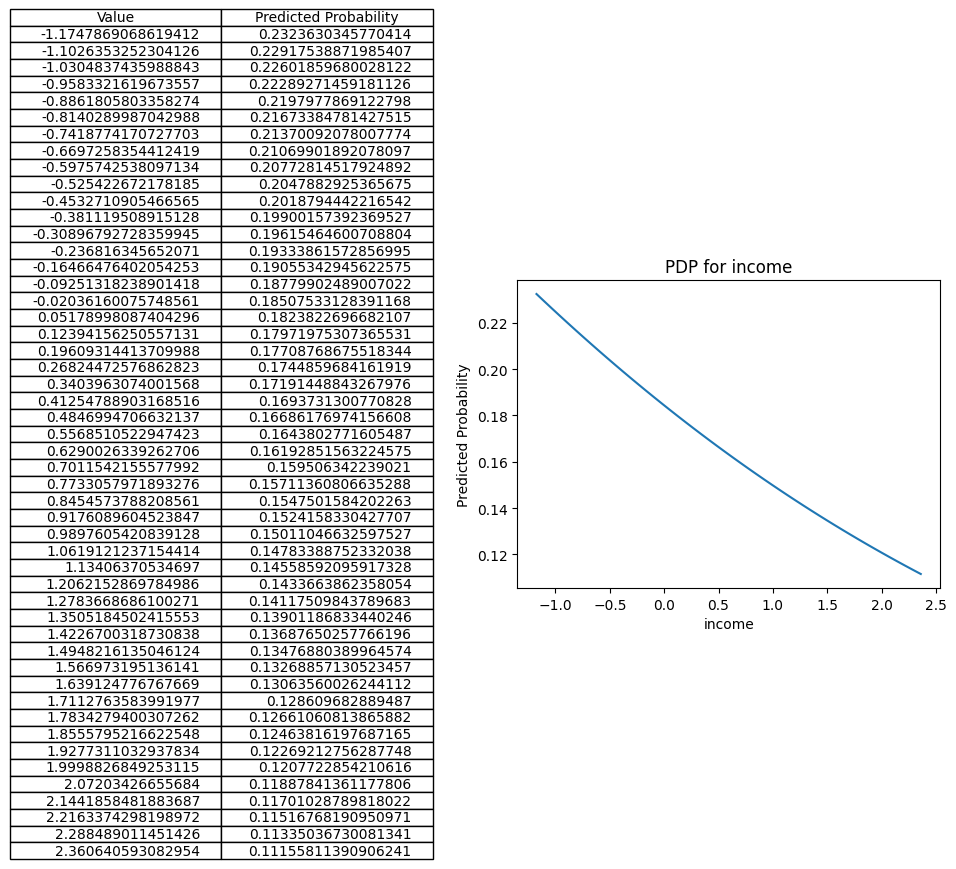

...

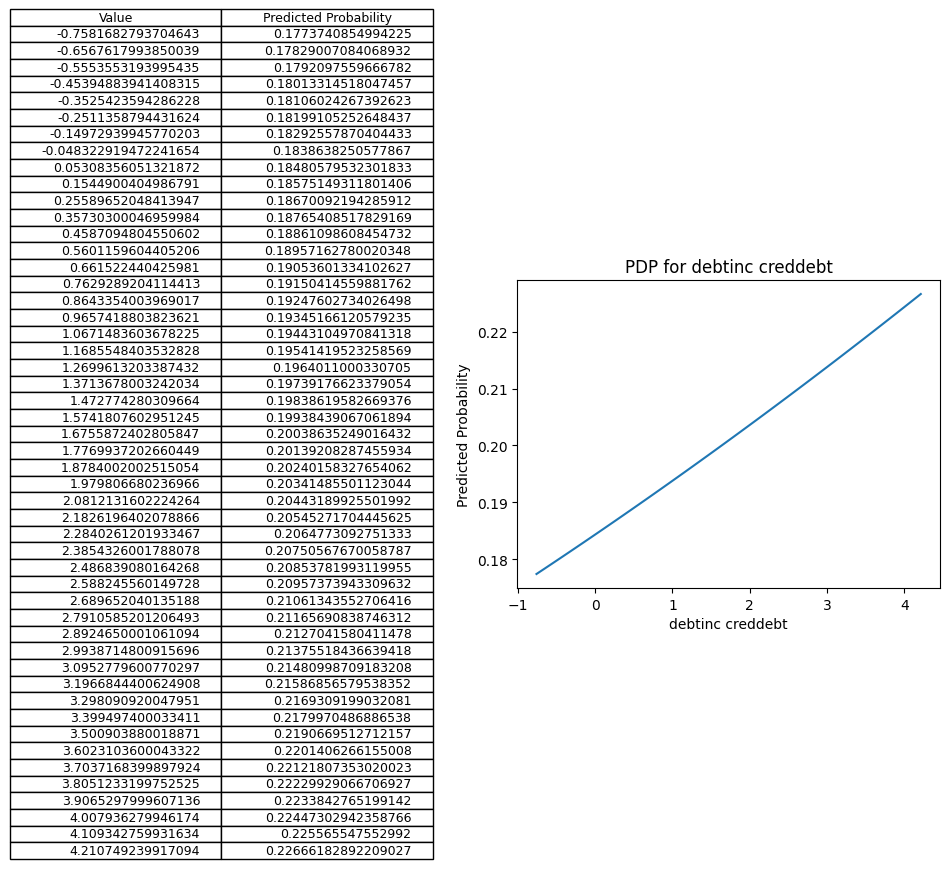

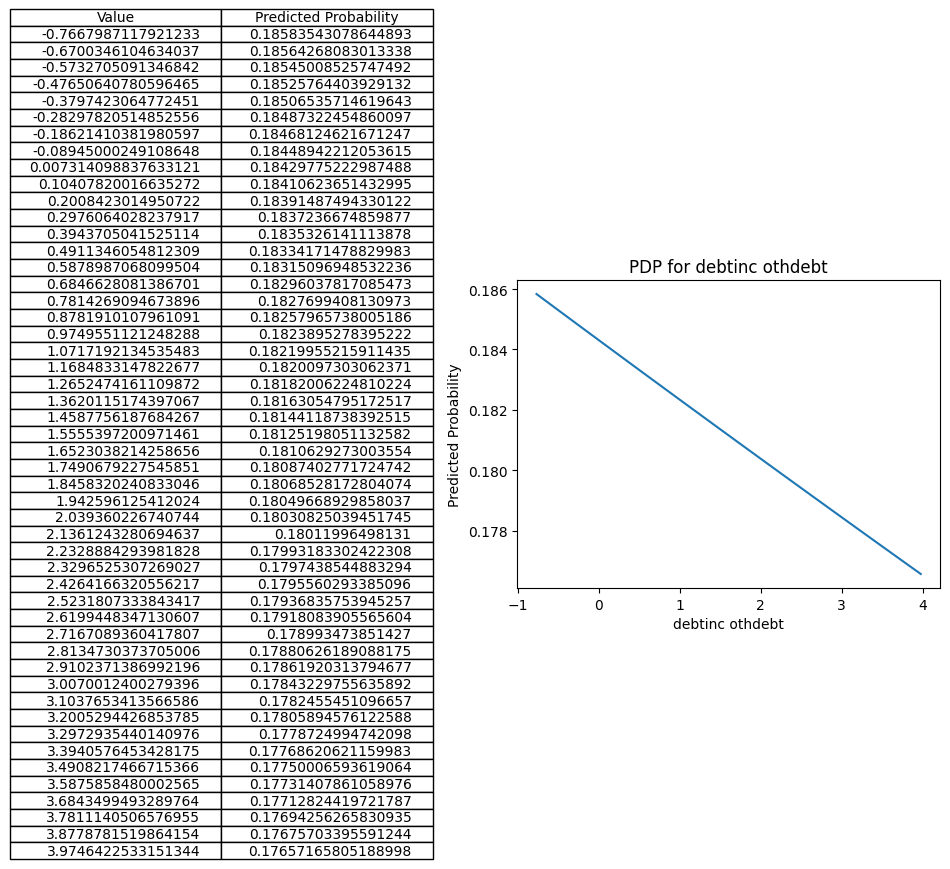

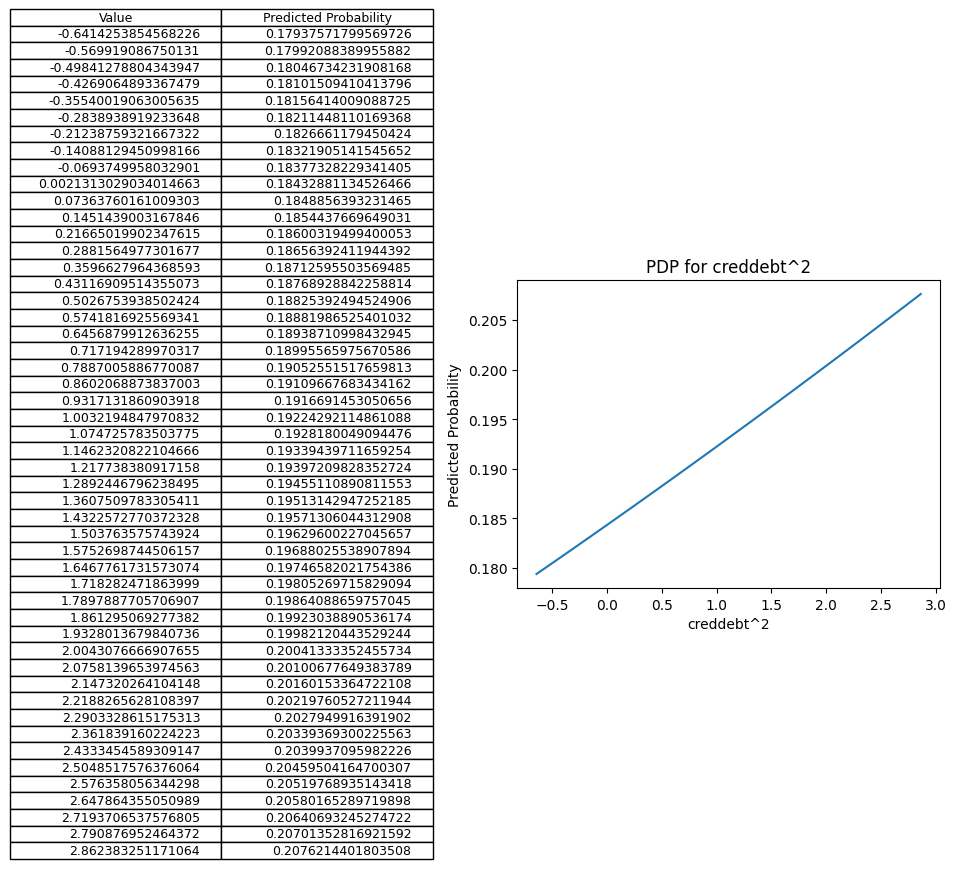

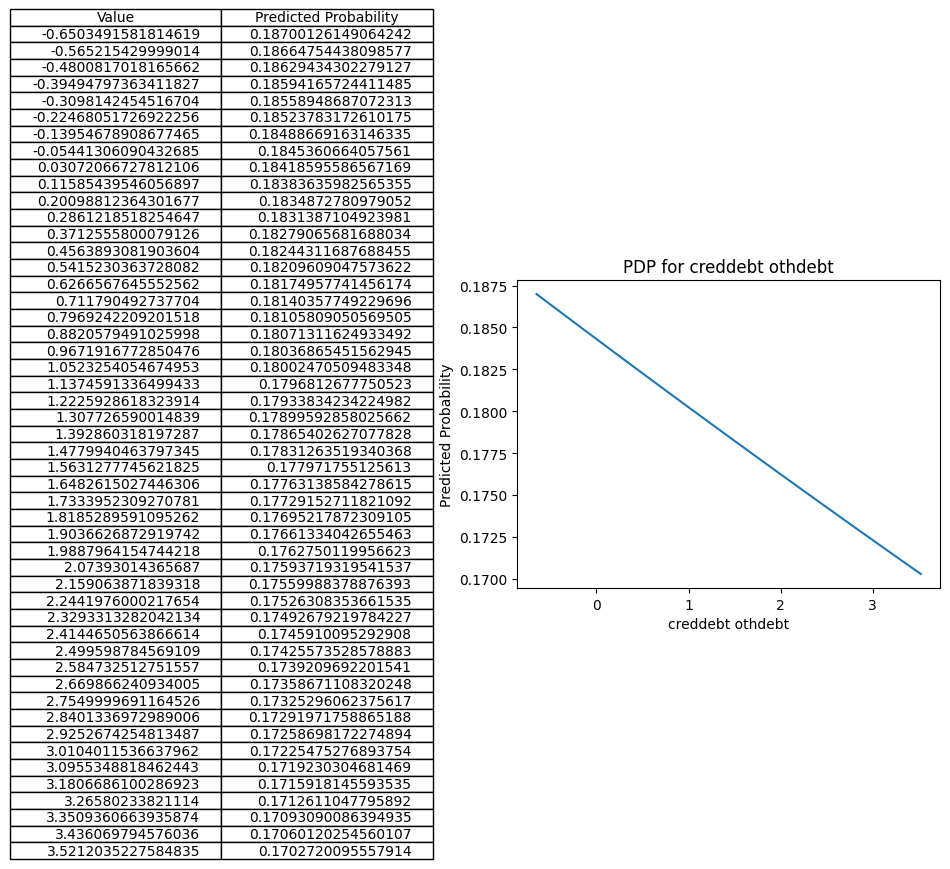

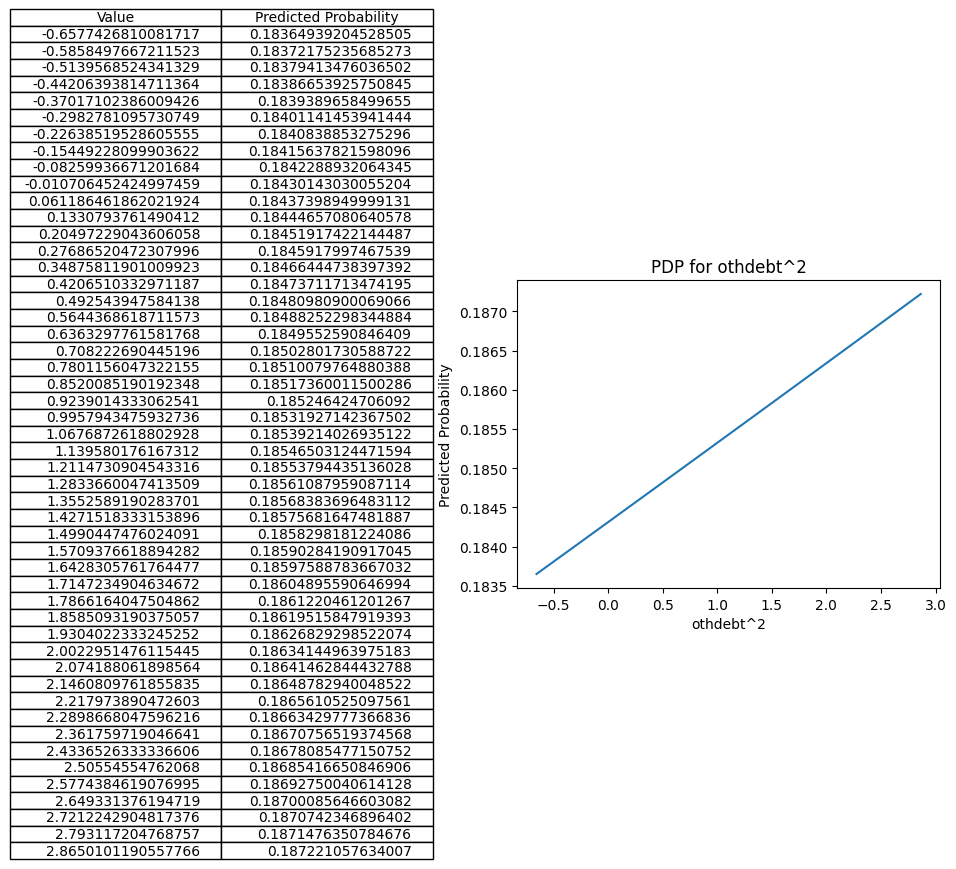

In [23]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Retrieve the best estimator from the GridSearchCV object
model = log_reg.best_estimator_

# Create a copy of the scaled data as a baseline
baseline = X_train_scaled.mean(axis=0)

# Feature names
feature_names = X_train_scaled_df.columns

# Iterate over each feature
for feature in feature_names:
    # Calculate the PDP
    values = np.linspace(X_train_scaled_df[feature].min(), X_train_scaled_df[feature].max(), 50)
    pdp_values = []
    for value in values:
        X_temp = baseline.copy()
        X_temp[feature_names.get_loc(feature)] = value
        pred_proba = model.predict_proba(X_temp.reshape(1, -1))[0, 1]
        pdp_values.append(pred_proba)

    # Create a table with the PDP values
    pdp_df = pd.DataFrame({'Value': values, 'Predicted Probability': pdp_values})

    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))

    # Table on the left
    ax1.axis('tight')
    ax1.axis('off')
    ax1.table(cellText=pdp_df.values, colLabels=pdp_df.columns, loc='center')

    # PDP plot on the right
    ax2.plot(values, pdp_values)
    ax2.set_xlabel(feature)
    ax2.set_ylabel('Predicted Probability')
    ax2.set_title(f'PDP for {feature}')

    plt.show()